In [66]:
import seaborn as sns
sns.set_theme(style="whitegrid")
from community import community_louvain
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics.cluster import normalized_mutual_info_score
import random
from scipy.stats import pearsonr, spearmanr, kendalltau
from itertools import combinations
from dataloader import DataLoader
import warnings
import os
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pycountry
warnings.filterwarnings("ignore")

In [67]:
loader = DataLoader(hs_code=282520)

_initialize_data took 27.1148 seconds


In [68]:
polar_df = loader.get_data()
df = polar_df.to_pandas()

years = sorted(df['t'].unique())
top_n = 20

yearly_graphs = loader.get_yearly_graphs(years)

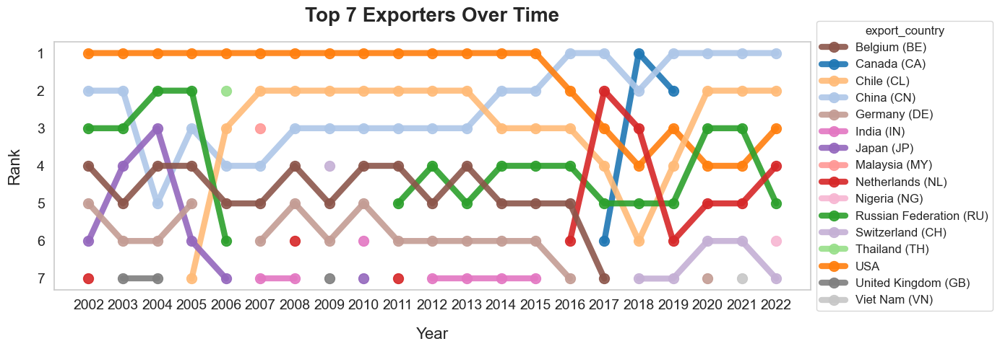

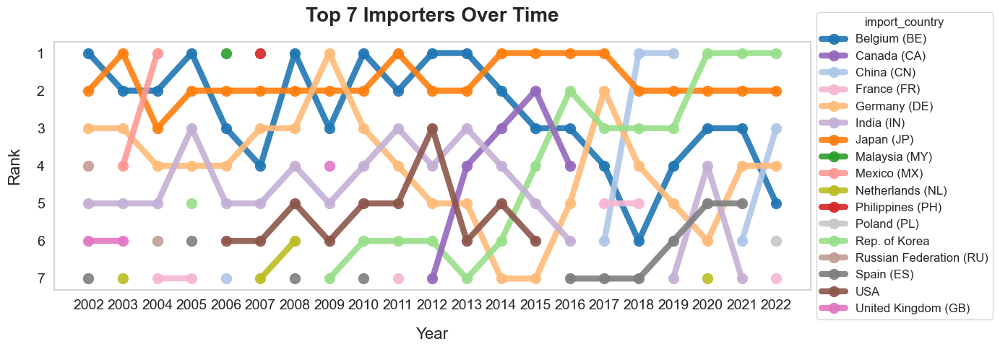

In [69]:
def create_bump_chart(df, category, value_col, time_col, top_n, title):
    df_grouped = (
        df.groupby([time_col, category])[value_col]
        .sum()
        .reset_index()
        .sort_values(by=[time_col, value_col], ascending=[True, False])
    )
    df_grouped['rank'] = (
        df_grouped.groupby(time_col)[value_col]
        .rank(method='first', ascending=False)
        .astype(int)
    )
    df_top = df_grouped[df_grouped['rank'] <= top_n]
    df_pivot = df_top.pivot(index=category, columns=time_col, values='rank')
    df_pivot = df_pivot.loc[df_pivot.min(axis=1).sort_values().index]

    fig, ax = plt.subplots(figsize=(14, 5))

    colors = sns.color_palette("tab20", len(df_pivot))

    for idx, (row, color) in enumerate(zip(df_pivot.iterrows(), colors)):
        country = row[0]
        country_info = pycountry.countries.get(name=country)
        country_flag = f" ({country_info.alpha_2})" if country_info else ""
        ax.plot(
            df_pivot.columns, row[1], marker='o', label=f'{country}{country_flag}', lw=6, markersize=10, alpha=0.9, color=color
        )

    ax.invert_yaxis()
    ax.set_xticks(df_pivot.columns)
    ax.set_yticks(range(1, top_n + 1))
    ax.set_xticklabels(df_pivot.columns, fontsize=14)
    ax.set_yticklabels(range(1, top_n + 1), fontsize=14)
    ax.set_title(title, fontsize=20, fontweight='bold', pad=20)
    ax.set_xlabel("Year", fontsize=16, labelpad=15)
    ax.set_ylabel("Rank", fontsize=16, labelpad=15)
    ax.grid(False)

    handles, labels = ax.get_legend_handles_labels()
    sorted_legend = sorted(zip(labels, handles), key=lambda x: x[0])
    sorted_labels, sorted_handles = zip(*sorted_legend)
    ax.legend(
        sorted_handles, sorted_labels, loc='center left', bbox_to_anchor=(1, 0.5), title=category, fontsize=12
    )

    plt.tight_layout()
    plt.show()

polar_df = loader.get_data()
df = polar_df.to_pandas()

top_n = 7
create_bump_chart(
    df,
    category='export_country',
    value_col='q',
    time_col='t',
    top_n=top_n,
    title=f"Top {top_n} Exporters Over Time"
)

create_bump_chart(
    df,
    category='import_country',
    value_col='q',
    time_col='t',
    top_n=top_n,
    title=f"Top {top_n} Importers Over Time"
)

Community Stability Over Time (NMI):
 [(np.int64(2002), np.int64(2003), np.float64(0.3079150943303561)), (np.int64(2003), np.int64(2004), np.float64(0.127433212791437)), (np.int64(2004), np.int64(2005), np.float64(0.15852141133425693)), (np.int64(2005), np.int64(2006), np.float64(0.20095986472988245)), (np.int64(2006), np.int64(2007), np.float64(0.3583749898749134)), (np.int64(2007), np.int64(2008), np.float64(0.23094676138435313)), (np.int64(2008), np.int64(2009), np.float64(0.25629939865799994)), (np.int64(2009), np.int64(2010), np.float64(0.24433396536145646)), (np.int64(2010), np.int64(2011), np.float64(0.17601412779624925)), (np.int64(2011), np.int64(2012), np.float64(0.3138231464011897)), (np.int64(2012), np.int64(2013), np.float64(0.31761557671717344)), (np.int64(2013), np.int64(2014), np.float64(0.35303769213539576)), (np.int64(2014), np.int64(2015), np.float64(0.37476888011586296)), (np.int64(2015), np.int64(2016), np.float64(0.20670542445634438)), (np.int64(2016), np.int64(20

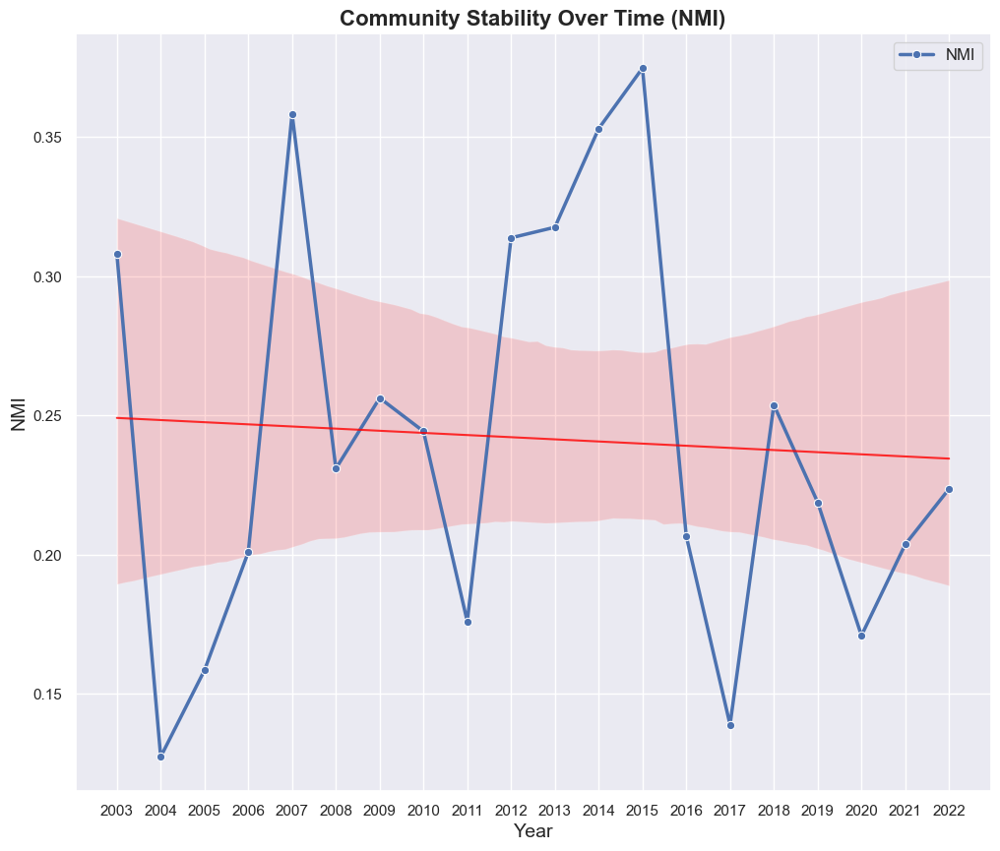

In [70]:


##############################################
# Data Loading
##############################################
cc_df = loader.country_codes.to_pandas()
country_code_to_name = dict(zip(cc_df["country_code"], cc_df["country_name"]))
country_code_to_iso3 = dict(zip(cc_df["country_code"], cc_df["country_iso3"]))

##############################################
# Communities Per Year
##############################################
year_communities = {}
for y, G in yearly_graphs.items():
    comms = greedy_modularity_communities(G, weight='weight')
    node2comm = {}
    for i, cset in enumerate(comms):
        for node in cset:
            node2comm[node] = i
    year_communities[y] = node2comm

##############################################
# Year-to-Year Community Stability (NMI)
##############################################
years_sorted = sorted(yearly_graphs.keys())
stability_results = []
for i in range(len(years_sorted)-1):
    y1, y2 = years_sorted[i], years_sorted[i+1]
    common_nodes = set(year_communities[y1].keys()).intersection(year_communities[y2].keys())
    c1 = [year_communities[y1][n] for n in common_nodes]
    c2 = [year_communities[y2][n] for n in common_nodes]
    nmi = normalized_mutual_info_score(c1, c2)
    stability_results.append((y1, y2, nmi))

print("Community Stability Over Time (NMI):\n", stability_results)

##############################################
# Visualization
##############################################
nmi_df = pd.DataFrame(stability_results, columns=['year_start', 'year_end', 'NMI'])
nmi_df['year'] = nmi_df['year_end']

plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")

sns.lineplot(x='year', y='NMI', data=nmi_df, marker='o', linewidth=2.5, label='NMI')
sns.regplot(x='year', y='NMI', data=nmi_df, scatter=False,
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Community Stability Over Time (NMI)", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(nmi_df["year"].unique().astype(int))
plt.ylabel("NMI", fontsize=14)
plt.legend(fontsize=12)

Intra-Community Trade Ratio Over Time:
 [(np.int64(2002), 0.5767354563241525), (np.int64(2003), 0.580190733133207), (np.int64(2004), 0.6126494858191425), (np.int64(2005), 0.6361511820818214), (np.int64(2006), 0.5321130316333584), (np.int64(2007), 0.6607941757234326), (np.int64(2008), 0.6038212613898888), (np.int64(2009), 0.6160040771563469), (np.int64(2010), 0.6557791668107102), (np.int64(2011), 0.6670712861049807), (np.int64(2012), 0.6649195610651842), (np.int64(2013), 0.6247132223165967), (np.int64(2014), 0.59430349478764), (np.int64(2015), 0.5943208750939316), (np.int64(2016), 0.6430614896304023), (np.int64(2017), 0.6963090070039022), (np.int64(2018), 0.7155275630364042), (np.int64(2019), 0.8714628602239763), (np.int64(2020), 0.8185099623735703), (np.int64(2021), 0.7979872442987744), (np.int64(2022), 0.8603347825540052)]


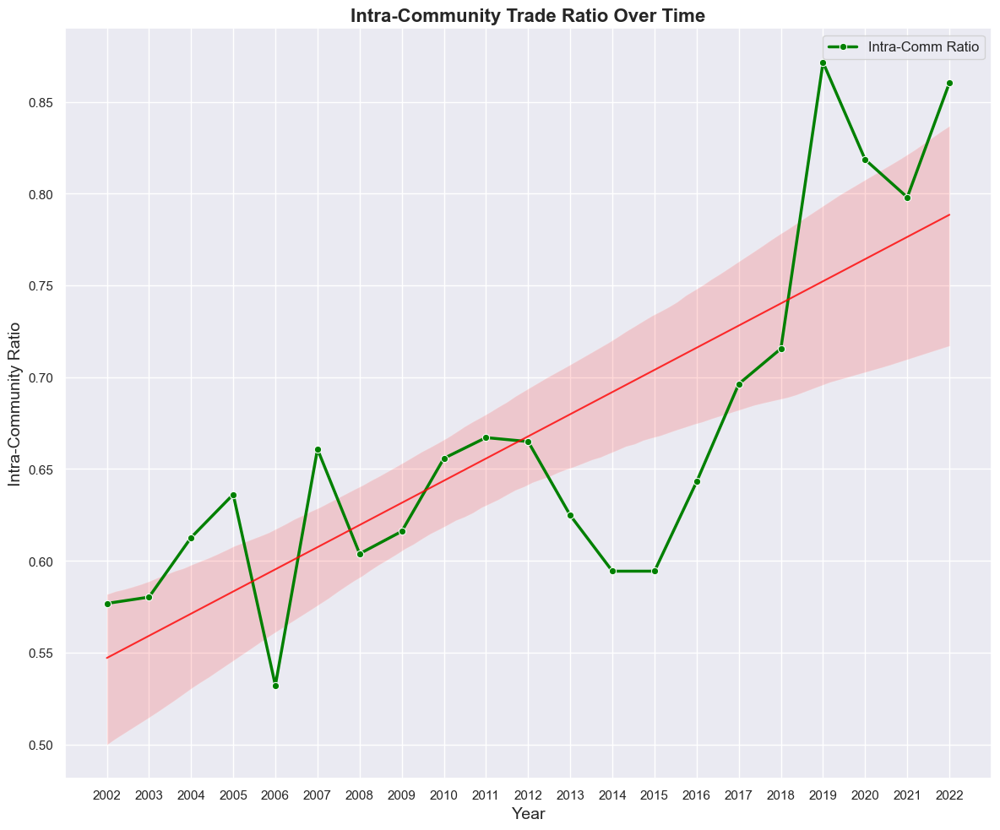

In [71]:
##############################################
# Compute Intra-Community Trade Ratio per Year
##############################################
intra_ratios = []
for y, G in yearly_graphs.items():
    comm_map = year_communities[y]
    intra_weight = 0.0
    inter_weight = 0.0

    for u, v, d in G.edges(data=True):
        if comm_map.get(u) == comm_map.get(v):
            intra_weight += d.get('weight', 0)
        else:
            inter_weight += d.get('weight', 0)

    total_weight = intra_weight + inter_weight
    if total_weight > 0:
        ratio = intra_weight / total_weight
        intra_ratios.append((y, ratio))

print("Intra-Community Trade Ratio Over Time:\n", intra_ratios)

intra_df = pd.DataFrame(intra_ratios, columns=['year', 'intra_ratio'])

##############################################
# Visualization
##############################################
plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")
sns.lineplot(x='year', y='intra_ratio', data=intra_df, marker='o', linewidth=2.5, color='green', label='Intra-Comm Ratio')
sns.regplot(x='year', y='intra_ratio', data=intra_df, scatter=False,
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Intra-Community Trade Ratio Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(intra_df["year"].unique().astype(int))
plt.ylabel("Intra-Community Ratio", fontsize=14)
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

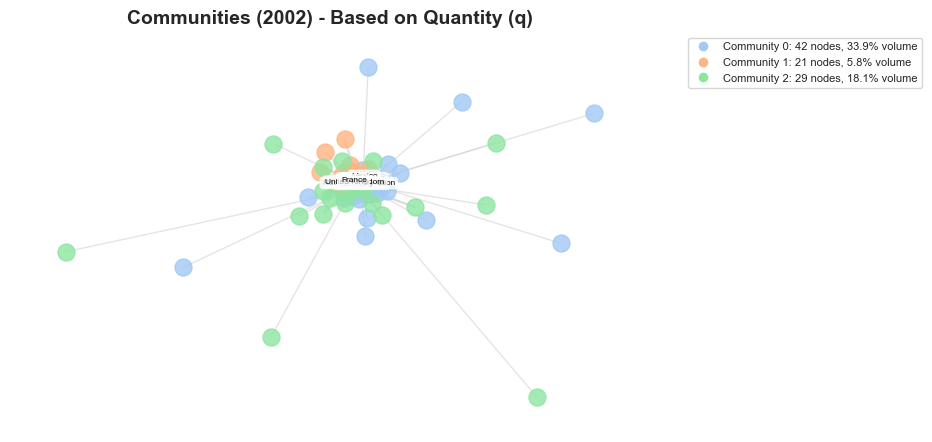

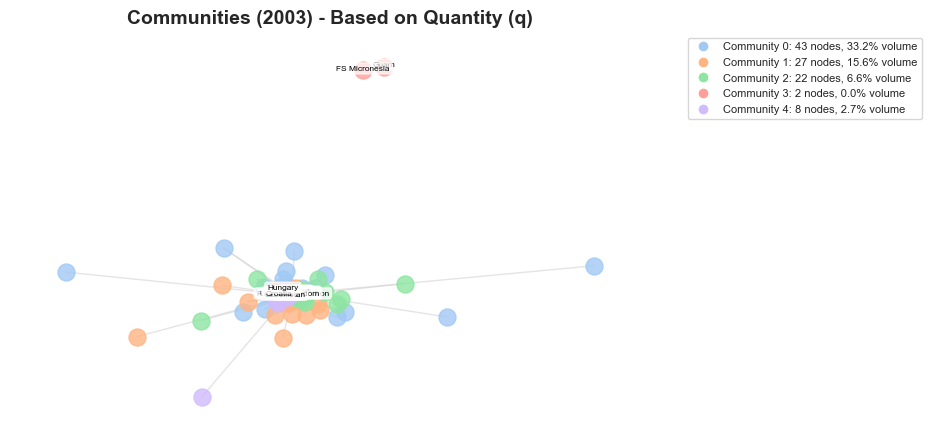

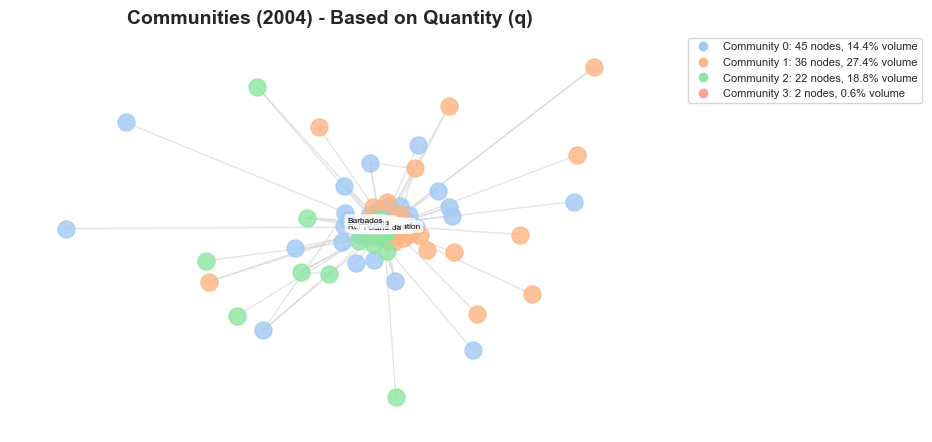

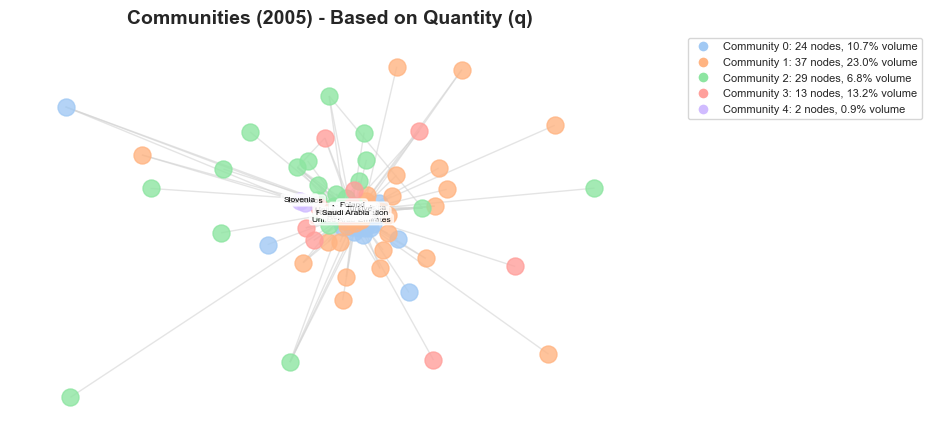

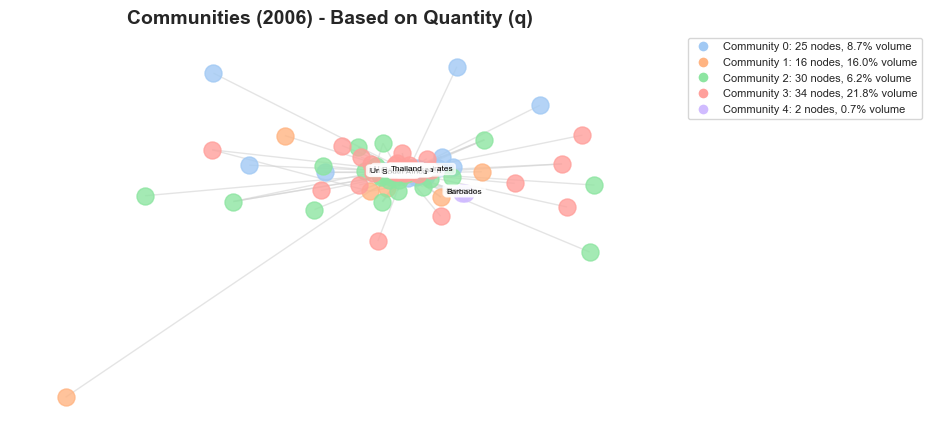

...

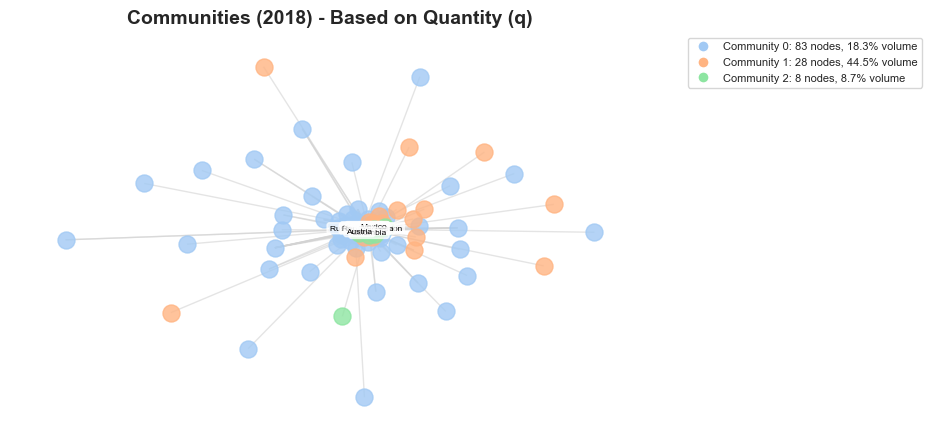

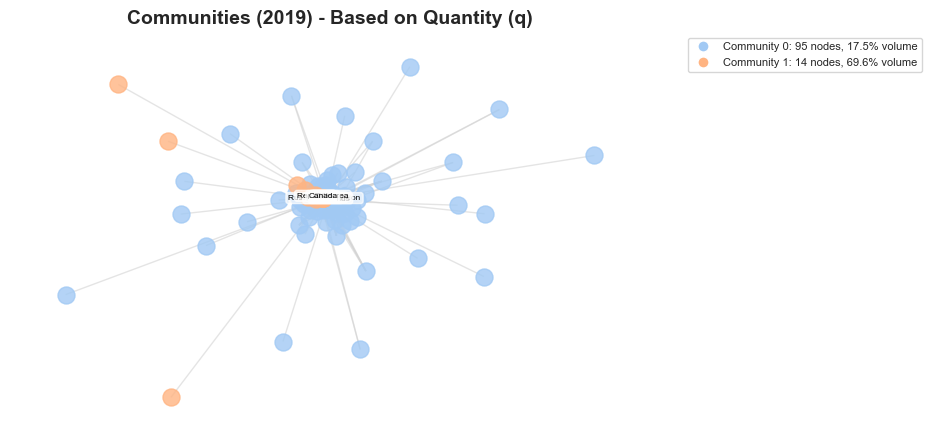

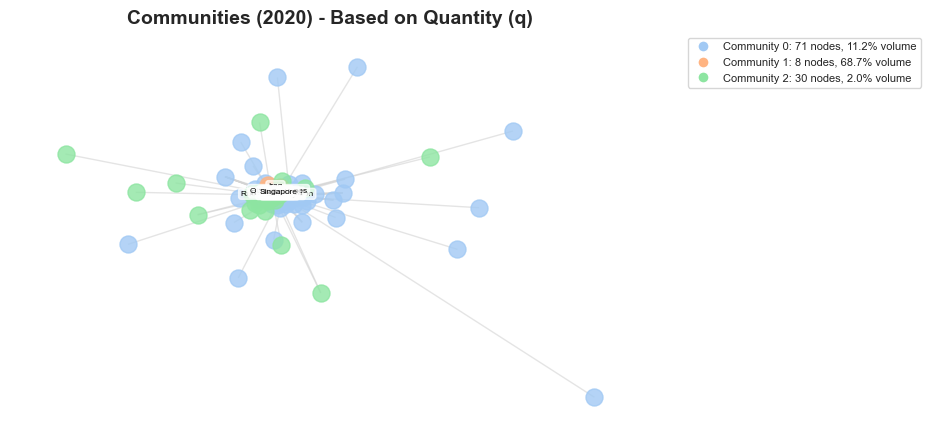

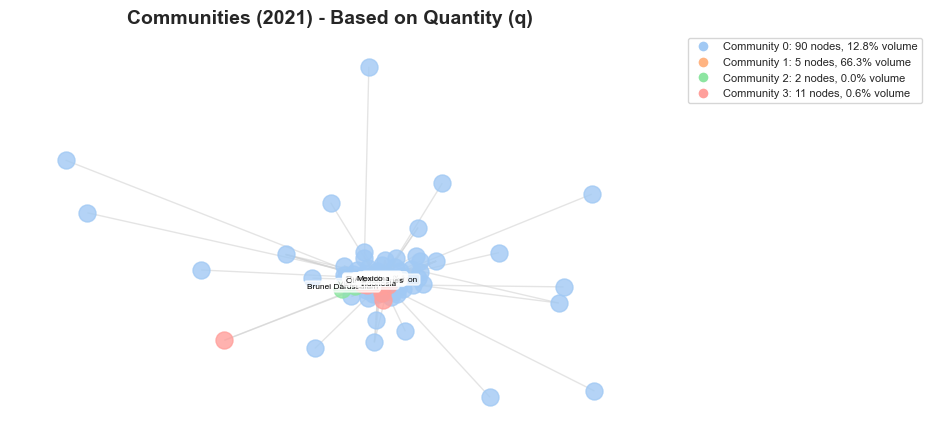

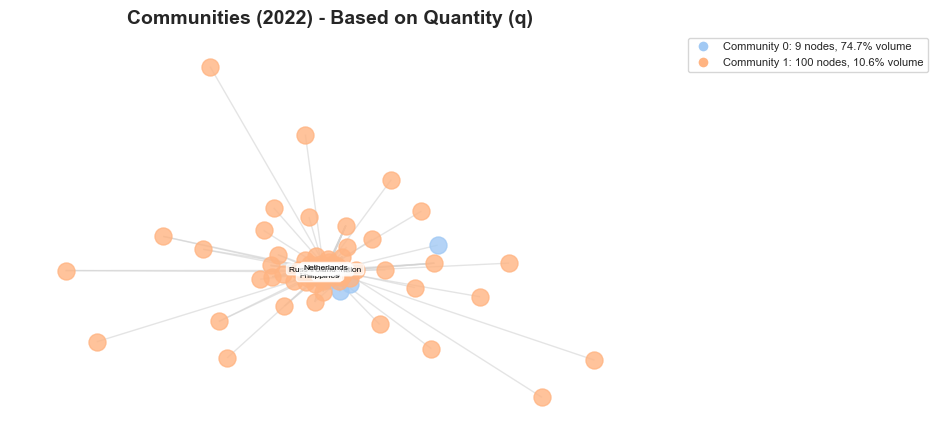

In [72]:
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
import numpy as np
import math

sns.set_theme(style='whitegrid')

for y in years:
    G = yearly_graphs[y]
    if G.number_of_nodes() == 0:
        print(f"Year {y}: No nodes to plot.")
        continue

    # Community Detection
    partition = community_louvain.best_partition(G, weight='weight') if G.number_of_edges() > 0 else {n: 0 for n in G.nodes()}
    communities = {c: [] for c in set(partition.values())}
    for n, c in partition.items():
        communities[c].append(n)

    # Node Strength Calculation
    node_strengths = {n: sum(d['weight'] for _, _, d in G.edges(n, data=True)) for n in G.nodes()}

    # Positioning Nodes
    pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)
    sorted_communities = sorted(communities.keys())
    palette = sns.color_palette("pastel", len(communities))
    community_colors = {c: palette[i] for i, c in enumerate(sorted_communities)}

    plt.figure(figsize=(8, 5))  # Compact figure
    plt.title(f"Communities ({y}) - Based on Quantity (q)", fontsize=14, fontweight='bold')

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color='lightgray', alpha=0.6)

    # Draw nodes
    for c in sorted_communities:
        nx.draw_networkx_nodes(
            G, pos, nodelist=communities[c],
            node_color=[community_colors[c]], node_size=150, alpha=0.8
        )

    # Labels for top nodes
    top_n_per_community = 5
    for c, nodes in communities.items():
        sorted_nodes = sorted(nodes, key=lambda n: node_strengths[n], reverse=True)[:top_n_per_community]
        for n in sorted_nodes:
            x, y = pos[n]
            plt.text(x, y, n, fontsize=6, ha='center', color='black', bbox=dict(facecolor='white', alpha=0.7, boxstyle='round'))

    # Compact legend
    total_volume = sum(d['weight'] for _, _, d in G.edges(data=True)) if G.number_of_edges() > 0 else 0
    community_volumes = {
        c: sum(d['weight'] for u, v, d in G.edges(data=True) if u in communities[c] and v in communities[c])
        for c in communities
    }
    legend_labels = [
        f"Community {c}: {len(communities[c])} nodes, {volume / total_volume * 100:.1f}% volume"
        for c, volume in community_volumes.items()
    ]
    plt.legend(
        [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=community_colors[c], markersize=8)
         for c in sorted_communities],
        legend_labels,
        loc='upper left', fontsize=8, frameon=True, bbox_to_anchor=(1.05, 1)
    )

    plt.axis('off')
    plt.tight_layout()
    plt.subplots_adjust(left=0.05, right=0.85, top=0.9, bottom=0.1)
    plt.show()


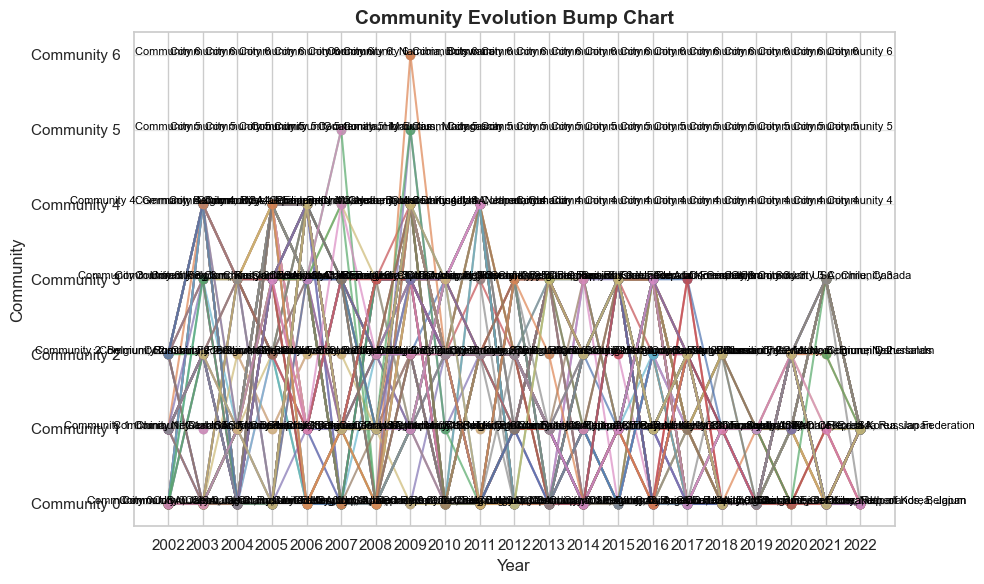

In [73]:
import matplotlib.pyplot as plt

# Dictionary to track top 3 countries per community for each year
top_countries_by_community = defaultdict(lambda: defaultdict(list))  # {year: {community: [countries]}}

# Calculate top 3 countries per community
for year, memberships in community_evolution.items():
    # Compute quantity per country (node strength)
    node_strengths = defaultdict(float)
    for country, community in memberships.items():
        if country in yearly_graphs[year]:
            node_strengths[country] = sum(
                d['weight'] for _, _, d in yearly_graphs[year].edges(country, data=True)
            )

    # Determine top 3 countries per community
    community_strength = defaultdict(list)
    for country, community in memberships.items():
        community_strength[community].append((country, node_strengths[country]))
    for community, countries in community_strength.items():
        sorted_countries = sorted(countries, key=lambda x: x[1], reverse=True)[:3]
        top_countries_by_community[year][community] = [c[0] for c in sorted_countries]

# Create a DataFrame-like structure for plotting
community_data = defaultdict(lambda: defaultdict(int))  # {year: {country: community}}
for year, memberships in community_evolution.items():
    for country, community in memberships.items():
        community_data[year][country] = community

# Bump Chart Plot
plt.figure(figsize=(10, 6))

# Get all years and all communities
years_sorted = sorted(community_data.keys())
countries = set(country for data in community_data.values() for country in data.keys())
communities = sorted(set(comm for data in community_data.values() for comm in data.values()))

# Prepare positions for the bump chart
for country in countries:
    positions = []
    for year in years_sorted:
        community = community_data.get(year, {}).get(country, None)
        if community is not None:
            positions.append(communities.index(community) + 1)
        else:
            positions.append(None)

    # Plot the line for each country
    if any(pos is not None for pos in positions):  # Only plot if the country appears at least once
        plt.plot(years_sorted, positions, alpha=0.7, linestyle='-', marker='o')

# Add community labels using top countries
for year in years_sorted:
    for community in communities:
        community_name = f"Community {community}"
        if community in top_countries_by_community[year]:
            top_countries = top_countries_by_community[year][community]
            community_name = f"{community_name}: {', '.join(top_countries)}"
        plt.text(year, communities.index(community) + 1, community_name, fontsize=8, ha='center', color='black')

# Customize the plot
plt.title("Community Evolution Bump Chart", fontsize=14, fontweight='bold')
plt.xlabel("Year", fontsize=12)
plt.ylabel("Community", fontsize=12)
plt.yticks(range(1, len(communities) + 1), [f"Community {i}" for i in communities])
plt.xticks(years_sorted)
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()

plt.show()


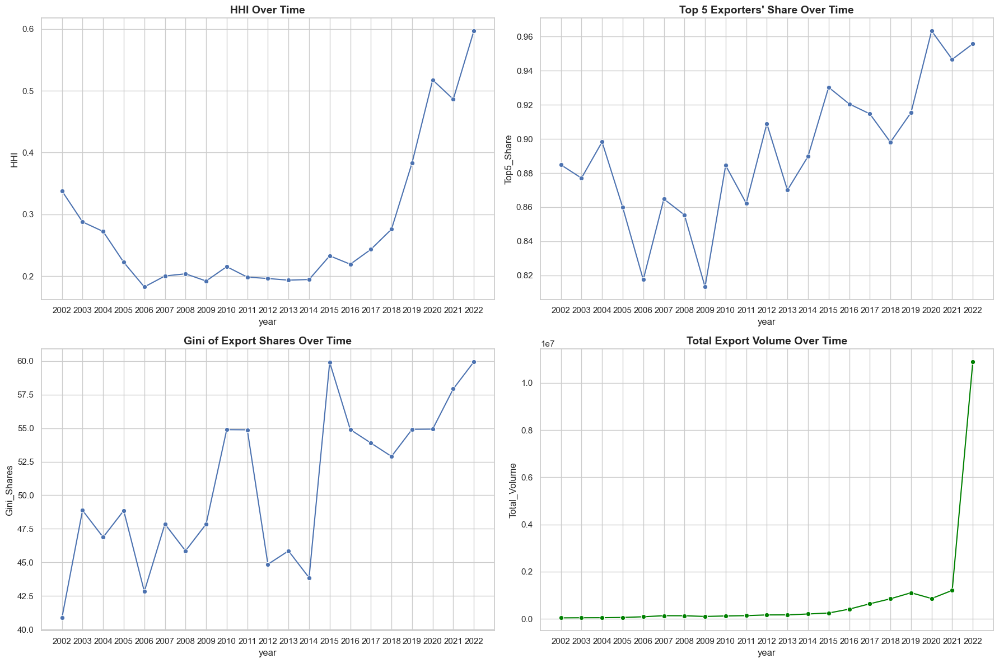

In [74]:
polar_df = loader.get_data()
df = polar_df.to_pandas()

yearly_exports = (
    df.groupby(["t", "export_country"], as_index=False)["v"].sum()
)

years_list = []
hhi_list = []
top5_share_list = []
gini_list = []
shannon_list = []
total_volume_list = []

def gini_coefficient(arr):
    arr = np.array(arr)
    arr = arr[arr > 0]
    arr = np.sort(arr)
    n = len(arr)
    if n == 0:
        return np.nan

    cumulative = np.cumsum(arr)
    sum_arr = cumulative[-1]
    if sum_arr == 0:
        return 0.0

    rel_cumulative = cumulative / sum_arr
    return (n+1 - 2*np.sum(rel_cumulative)/n)

for year, grp in yearly_exports.groupby("t"):
    total_exports = grp["v"].sum()
    shares = grp["v"] / total_exports

    # HHI (Herfindhal Hirschman Index)
    hhi = (shares ** 2).sum()

    # Top 5 Exporter Share
    sorted_shares = np.sort(shares)[::-1]
    top5 = sorted_shares[:5].sum() if len(sorted_shares)>=5 else sorted_shares.sum()

    # Gini Coefficient of Exporter Share
    gini_val = gini_coefficient(shares.values)

    years_list.append(year)
    hhi_list.append(hhi)
    top5_share_list.append(top5)
    gini_list.append(gini_val)
    total_volume_list.append(total_exports)

metrics_df = pd.DataFrame({
    "year": years_list,
    "HHI": hhi_list,
    "Top5_Share": top5_share_list,
    "Gini_Shares": gini_list,
    "Total_Volume": total_volume_list
})

sns.set_theme(style="whitegrid")
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
axs = axs.flatten()

sns.lineplot(data=metrics_df, x="year", y="HHI", marker="o", ax=axs[0])
axs[0].set_title("HHI Over Time", fontsize=14, fontweight='bold')
axs[0].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Top5_Share", marker="o", ax=axs[1])
axs[1].set_title("Top 5 Exporters' Share Over Time", fontsize=14, fontweight='bold')
axs[1].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Gini_Shares", marker="o", ax=axs[2])
axs[2].set_title("Gini of Export Shares Over Time", fontsize=14, fontweight='bold')
axs[2].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Total_Volume", marker="o", ax=axs[3], color='green')
axs[3].set_title("Total Export Volume Over Time", fontsize=14, fontweight='bold')
axs[3].set_xticks(metrics_df["year"].unique().astype(int))

plt.tight_layout()
plt.show()

In [75]:
##############################################
#
# INTERPRETATION:
#
##############################################

# HHI
##############################################
# If the HHI is close to 1, it means one exporter dominates nearly all trade.
# HHI increased sharply from 2017 onwards leading to a more concentrated network
##############################################


# Top5 Exporter Shares
##############################################


# Gini of Export Shares
##############################################


# Total Export Volume
##############################################




In [76]:

##############################################
# Helper Functions
##############################################
def compute_diameter(G):
    if G.number_of_nodes() == 0:
        return np.nan
    if nx.is_connected(G):
        return nx.diameter(G)
    else:
        GCC = max(nx.connected_components(G), key=len)
        G_sub = G.subgraph(GCC)
        if G_sub.number_of_nodes() > 1:
            return nx.diameter(G_sub)
        else:
            return 0.0

def compute_degree_assortativity(G):
    if G.number_of_edges() > 0:
        return nx.degree_assortativity_coefficient(G, x='degree')
    else:
        return np.nan

def compute_avg_node_strength(G):
    if G.number_of_nodes() == 0:
        return np.nan
    strengths = []
    for n in G.nodes():
        strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
        strengths.append(strength)
    if len(strengths) > 0:
        return np.mean(strengths)
    else:
        return np.nan

def gini_coefficient(values):
    arr = np.sort(values)
    n = len(arr)
    if n == 0:
        return np.nan

    cumulative = np.cumsum(arr)
    sum_arr = cumulative[-1]
    if sum_arr == 0:
        return 0.0

    rel_cumulative = cumulative / sum_arr
    return (n+1 - 2*np.sum(rel_cumulative)/n)

def compute_gini_node_strength(G):
    if G.number_of_nodes() == 0:
        return np.nan
    strengths = [sum(d['weight'] for _,_,d in G.edges(n, data=True)) for n in G.nodes()]
    if len(strengths) == 0:
        return np.nan
    return gini_coefficient(strengths)

def compute_fraction_bridges(G):
    if G.number_of_edges() == 0:
        return 0.0
    bridges = list(nx.bridges(G))
    return len(bridges) / G.number_of_edges()


In [77]:



##############################################
# Building Yearly Graphs
##############################################
yearly_graphs = {}
for y in years:
    df_year = df[df['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['v'].sum()
    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        value = row['v']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += value
            else:
                G.add_edge(exporter, importer, weight=value)
    yearly_graphs[y] = G

##############################################
# Network Metrics Over Time
##############################################
results = {
    'year': [],
    'num_nodes': [],
    'num_edges': [],
    'density': [],
    'avg_clustering': [],
    'avg_shortest_path': [],
    'modularity': [],
    'num_communities': [],
    'diameter': [],
    'degree_assortativity': [],
    'avg_node_strength': [],
    'gini_node_strength': [],
    'fraction_bridges': [],
}

for y, G in yearly_graphs.items():
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    density = nx.density(G)

    # Average Clustering Coefficient
    avg_clustering = nx.average_clustering(G)

    # Average shortest path length
    if nx.is_connected(G):
        avg_sp = nx.average_shortest_path_length(G)
    else:
        GCC = max(nx.connected_components(G), key=len)
        G_sub = G.subgraph(GCC)
        avg_sp = nx.average_shortest_path_length(G_sub)

    # Community Detection
    partition = community_louvain.best_partition(G, weight='weight')
    mod = community_louvain.modularity(partition, G, weight='weight')
    num_com = len(set(partition.values()))

    # Diameter
    diameter = compute_diameter(G)

    # Degree Assortativity
    degree_assort = compute_degree_assortativity(G)

    # Average Node Strength
    avg_strength = compute_avg_node_strength(G)

    # Gini Coefficient of Node Strength
    gini_strength = compute_gini_node_strength(G)

    # Fraction Bridges
    frac_bridges = compute_fraction_bridges(G)

    results['year'].append(y)
    results['num_nodes'].append(num_nodes)
    results['num_edges'].append(num_edges)
    results['density'].append(density)
    results['avg_clustering'].append(avg_clustering)
    results['avg_shortest_path'].append(avg_sp)
    results['modularity'].append(mod)
    results['num_communities'].append(num_com)
    results['diameter'].append(diameter)
    results['degree_assortativity'].append(degree_assort)
    results['avg_node_strength'].append(avg_strength)
    results['gini_node_strength'].append(gini_strength)
    results['fraction_bridges'].append(frac_bridges)

results_df = pd.DataFrame(results)



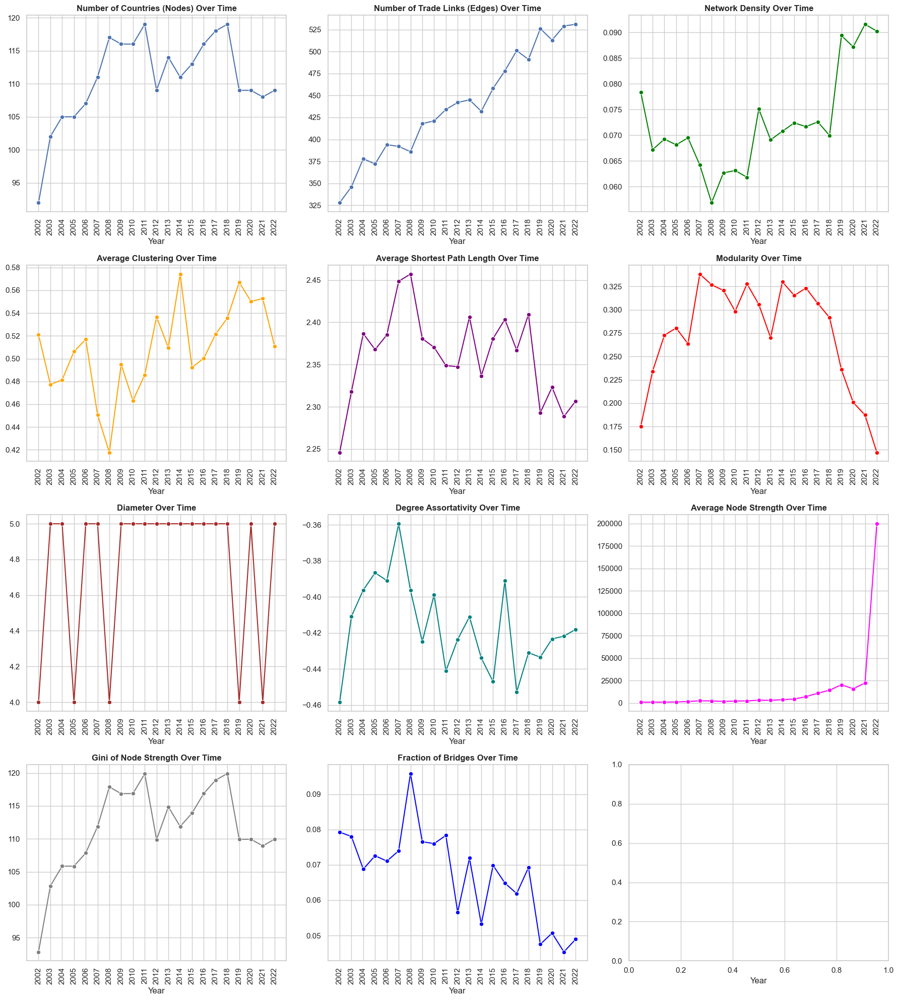

In [78]:
##############################################
# Visualization
##############################################
sns.set_theme(style="whitegrid")

fig, axs = plt.subplots(4, 3, figsize=(18, 20))
axs = axs.flatten()

sns.lineplot(data=results_df, x='year', y='num_nodes', ax=axs[0], marker='o')
axs[0].set_title("Number of Countries (Nodes) Over Time", fontweight="bold")
axs[0].set_xticks(results_df["year"].unique().astype(int))
axs[0].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='num_edges', ax=axs[1], marker='o')
axs[1].set_title("Number of Trade Links (Edges) Over Time", fontweight="bold")
axs[1].set_xticks(results_df["year"].unique().astype(int))
axs[1].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='density', ax=axs[2], marker='o', color='green')
axs[2].set_title("Network Density Over Time", fontweight="bold")
axs[2].set_xticks(results_df["year"].unique().astype(int))
axs[2].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_clustering', ax=axs[3], marker='o', color='orange')
axs[3].set_title("Average Clustering Over Time", fontweight="bold")
axs[3].set_xticks(results_df["year"].unique().astype(int))
axs[3].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_shortest_path', ax=axs[4], marker='o', color='purple')
axs[4].set_title("Average Shortest Path Length Over Time", fontweight="bold")
axs[4].set_xticks(results_df["year"].unique().astype(int))
axs[4].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='modularity', ax=axs[5], marker='o', color='red')
axs[5].set_title("Modularity Over Time", fontweight="bold")
axs[5].set_xticks(results_df["year"].unique().astype(int))
axs[5].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='diameter', ax=axs[6], marker='o', color='brown')
axs[6].set_title("Diameter Over Time", fontweight="bold")
axs[6].set_xticks(results_df["year"].unique().astype(int))
axs[6].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='degree_assortativity', ax=axs[7], marker='o', color='teal')
axs[7].set_title("Degree Assortativity Over Time", fontweight="bold")
axs[7].set_xticks(results_df["year"].unique().astype(int))
axs[7].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_node_strength', ax=axs[8], marker='o', color='magenta')
axs[8].set_title("Average Node Strength Over Time", fontweight="bold")
axs[8].set_xticks(results_df["year"].unique().astype(int))
axs[8].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='gini_node_strength', ax=axs[9], marker='o', color='gray')
axs[9].set_title("Gini of Node Strength Over Time", fontweight="bold")
axs[9].set_xticks(results_df["year"].unique().astype(int))
axs[9].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='fraction_bridges', ax=axs[10], marker='o', color='blue')
axs[10].set_title("Fraction of Bridges Over Time", fontweight="bold")
axs[10].set_xticks(results_df["year"].unique().astype(int))
axs[10].tick_params(axis='x', labelrotation=90)

for ax in axs:
    ax.set_xlabel("Year")
    ax.set_ylabel("")
    ax.grid(True)

plt.tight_layout()
plt.show()

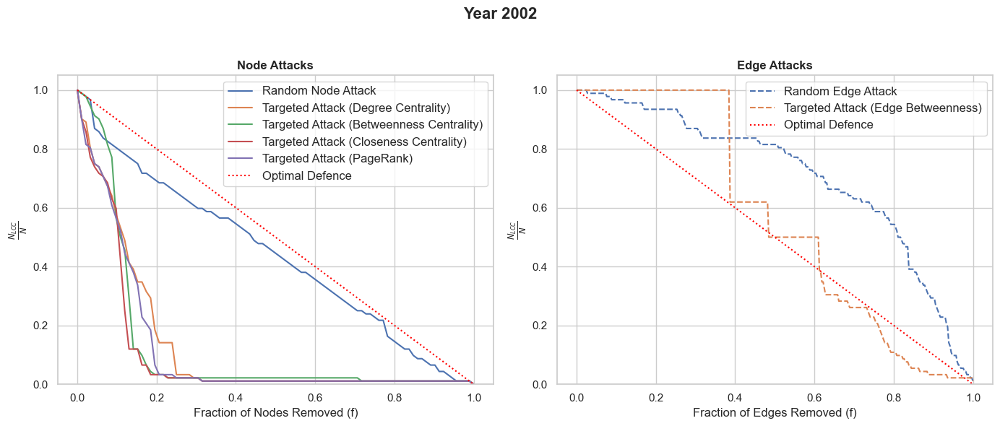

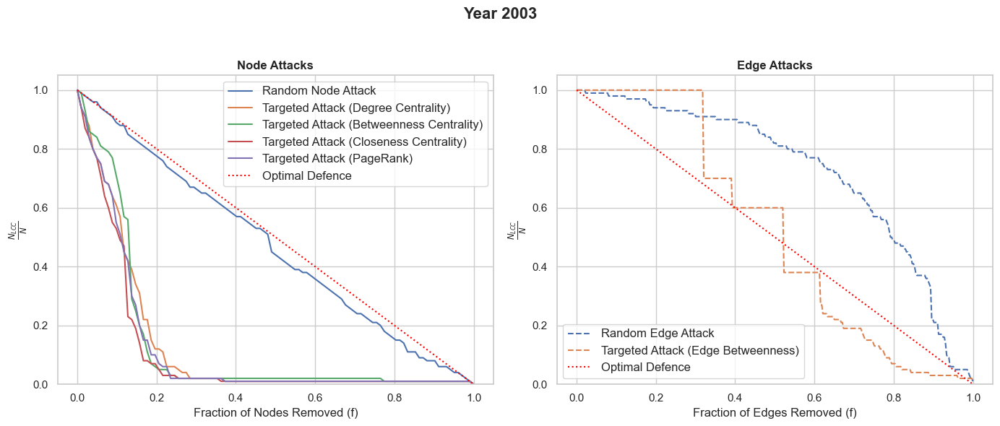

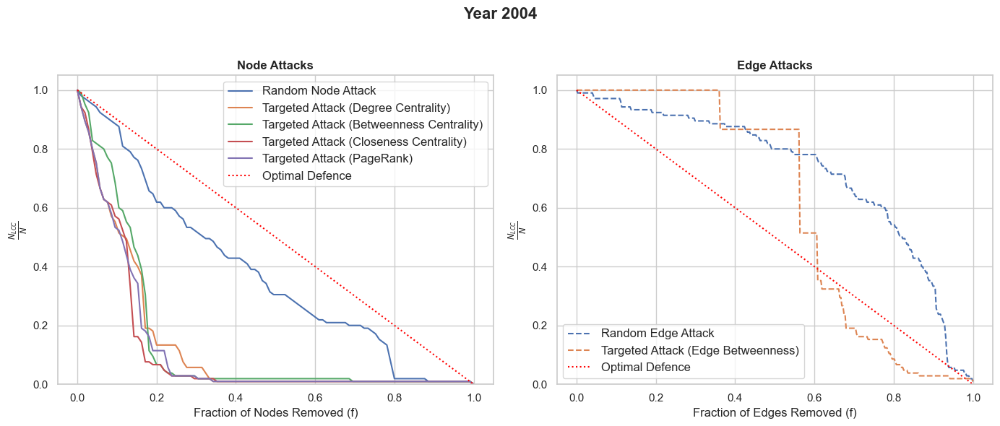

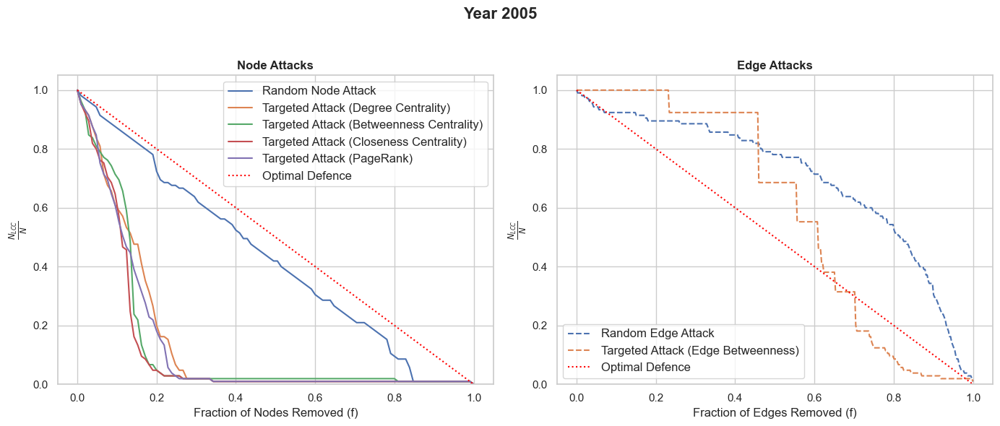

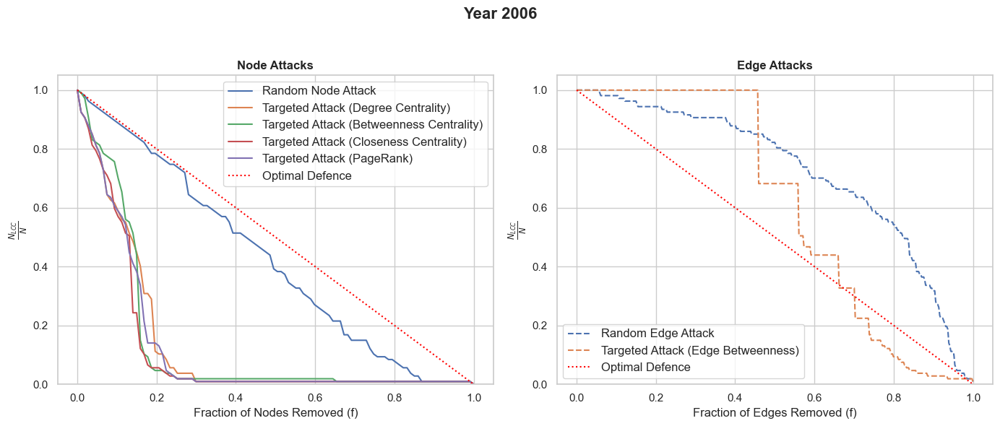

...

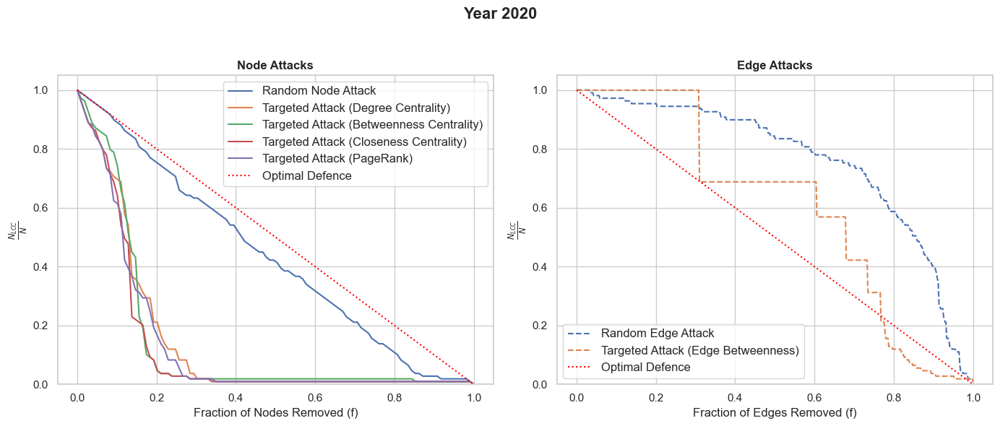

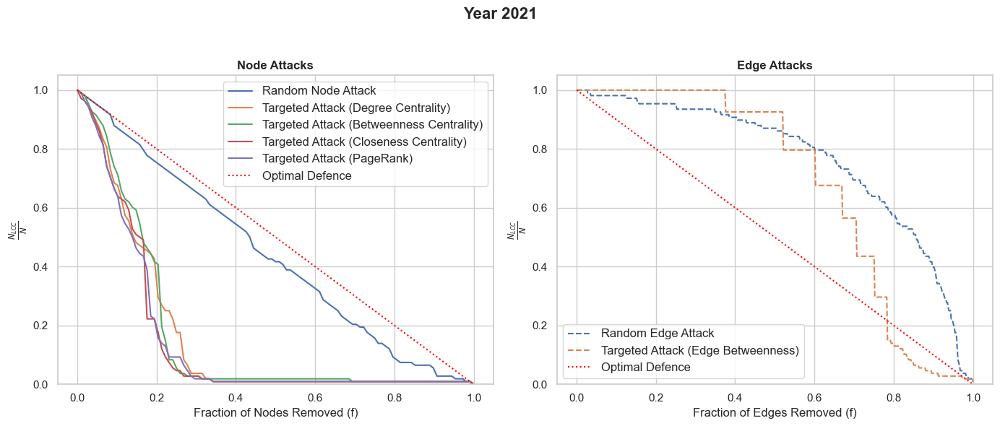

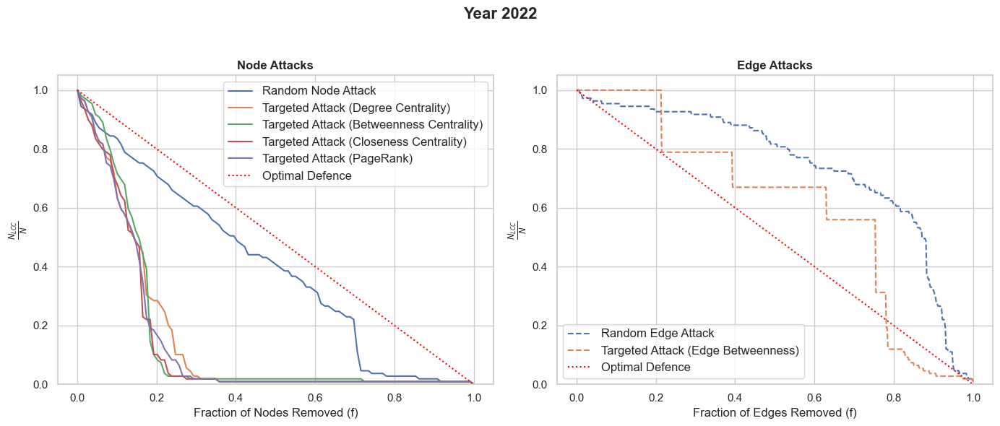

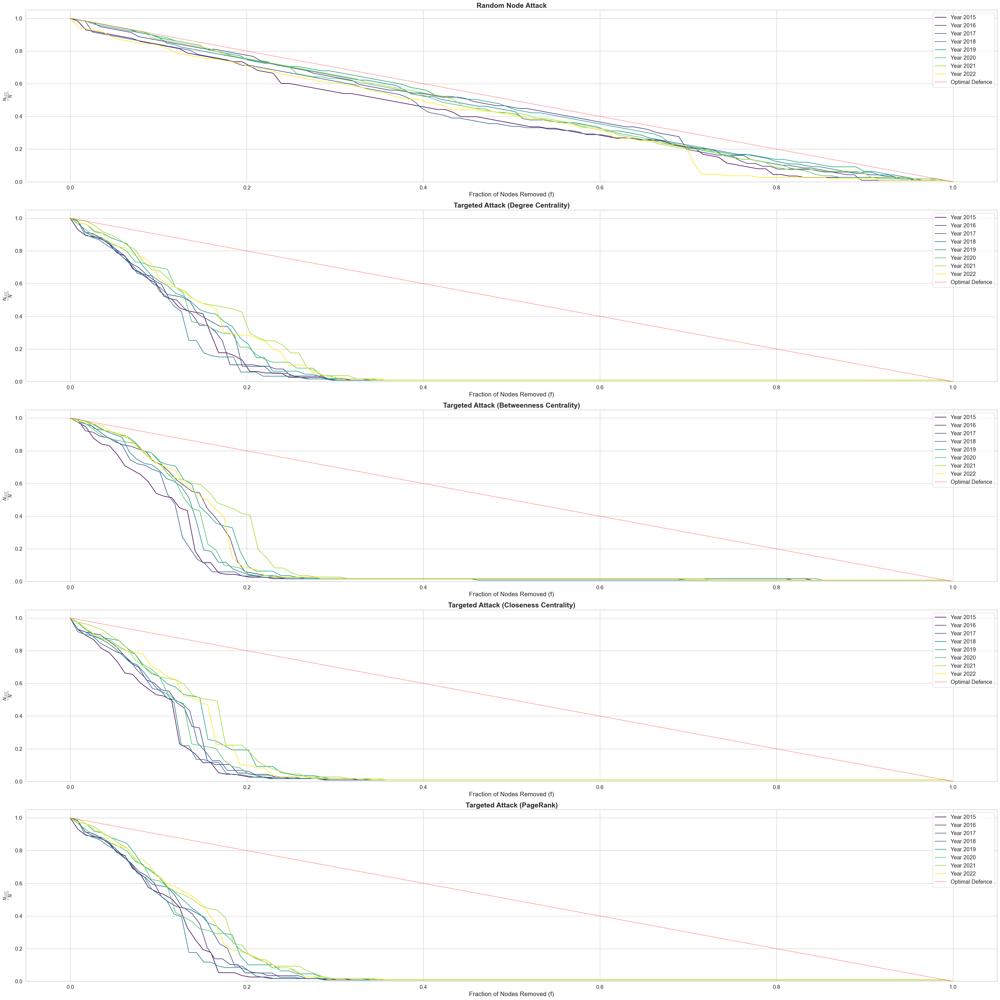

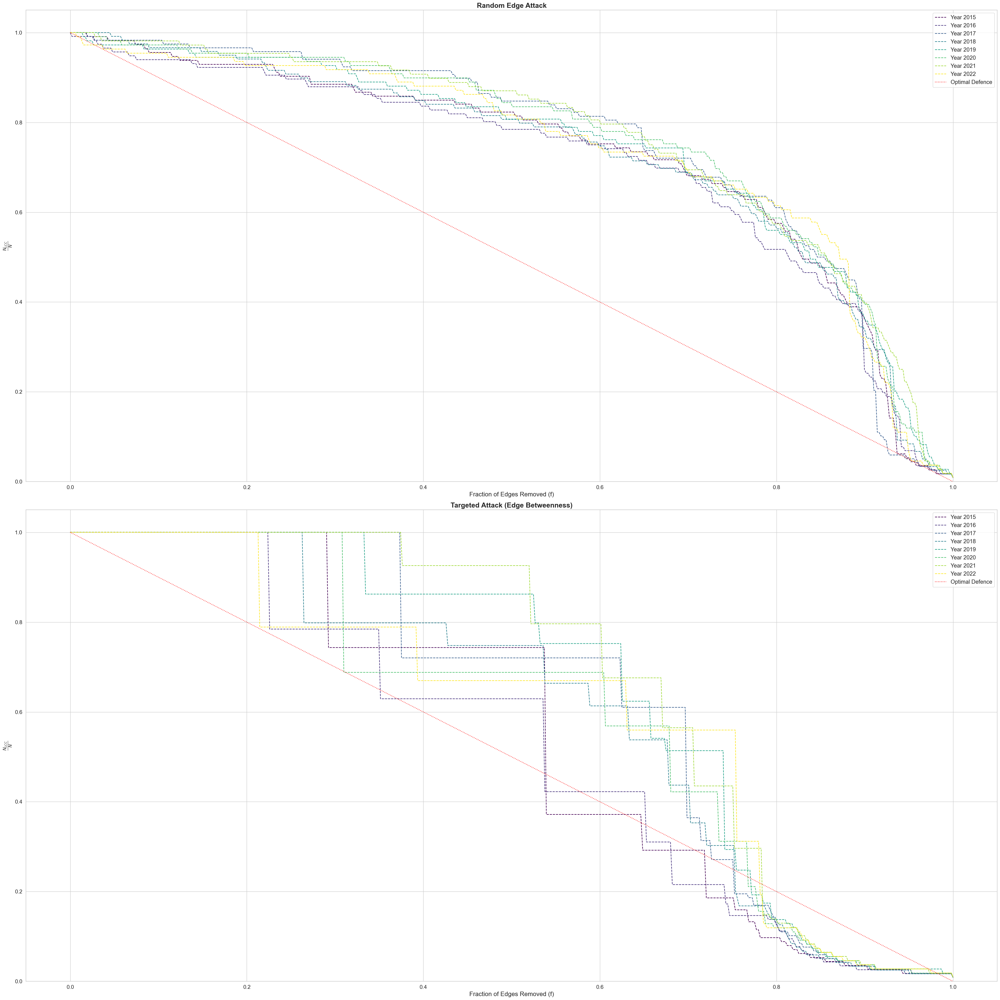

In [79]:
plt.rcParams['figure.figsize'] = (10, 6)

##############################################
# Attack Simulations
##############################################
def targeted_closeness_attack(G):
    """Remove highest closeness node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        close = nx.closeness_centrality(G_copy)
        target = max(close, key=close.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_eigenvector_attack(G):
    """Remove highest eigenvector centrality node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        eig = nx.eigenvector_centrality(G_copy, max_iter=1000, weight='weight')
        target = max(eig, key=eig.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_pagerank_attack(G):
    """Remove highest PageRank node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        pr = nx.pagerank(G_copy, weight='weight')
        target = max(pr, key=pr.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_edge_betweenness_attack(G):
    """Remove highest edge betweenness edge iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while G_copy.number_of_edges() > 0:
        edge_bet = nx.edge_betweenness_centrality(G_copy, weight='weight')
        target = max(edge_bet, key=edge_bet.get)
        G_copy.remove_edge(*target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def largest_cc_size(G):
    if len(G) == 0:
        return 0
    return len(max(nx.connected_components(G), key=len))

def random_node_attack(G):
    """Remove nodes at random one by one, record LCC size."""
    nodes = list(G.nodes())
    random.shuffle(nodes)
    lcc_sizes = []
    G_copy = G.copy()
    initial_lcc = largest_cc_size(G_copy)
    lcc_sizes.append(initial_lcc)

    for n in nodes:
        G_copy.remove_node(n)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_degree_attack(G):
    """Remove highest-degree node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        deg = dict(G_copy.degree(weight='weight'))
        target = max(deg, key=deg.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_betweenness_dynamic_attack(G):
    """Remove highest betweenness node each iteration (dynamic recalculation)."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        bet = nx.betweenness_centrality(G_copy, weight='weight')
        target = max(bet, key=bet.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def random_edge_attack(G):
    """Remove edges at random one by one, record LCC size."""
    G_copy = G.copy()
    edges = list(G_copy.edges())
    random.shuffle(edges)
    lcc_sizes = [largest_cc_size(G_copy)]
    for e in edges:
        G_copy.remove_edge(*e)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

##############################################
# Prepare results_list for plot_attacks
##############################################
results_list = []
for y in years:
    G = yearly_graphs[y]
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    random_node_lcc = random_node_attack(G)
    targeted_deg_lcc = targeted_degree_attack(G)
    targeted_bet_lcc = targeted_betweenness_dynamic_attack(G)
    random_edge_lcc = random_edge_attack(G)

    targeted_close_lcc = targeted_closeness_attack(G)
    targeted_pr_lcc = targeted_pagerank_attack(G)
    targeted_edge_bet_lcc = targeted_edge_betweenness_attack(G)

    results = {
        'title': f"Year {y}",
        'num_nodes': num_nodes,
        'num_edges': num_edges,
        'random_node': random_node_lcc,
        'targeted_degree': targeted_deg_lcc,
        'targeted_betweenness_dynamic': targeted_bet_lcc,
        'random_edge': random_edge_lcc,
        'targeted_closeness': targeted_close_lcc,
        'targeted_pagerank': targeted_pr_lcc,
        'targeted_edge_betweenness': targeted_edge_bet_lcc
    }
    results_list.append(results)

##############################################
# Compute AUC (Robustness Index)
##############################################
def compute_auc(fractions, sizes):
    auc = 0.0
    for i in range(len(fractions)-1):
        x1, x2 = fractions[i], fractions[i+1]
        y1, y2 = sizes[i], sizes[i+1]
        auc += (x2 - x1) * (y1 + y2) / 2.0
    return auc

##############################################
# Visualization
##############################################
def plot_attacks(results_list):

    attack_types_node = [
        'random_node',
        'targeted_degree',
        'targeted_betweenness_dynamic',
        'targeted_closeness',
        'targeted_pagerank'
    ]

    attack_types_edge = [
        'random_edge',
        'targeted_edge_betweenness'
    ]

    attack_labels = {
        'random_node': 'Random Node Attack',
        'random_edge': 'Random Edge Attack',
        'targeted_degree': 'Targeted Attack (Degree Centrality)',
        'targeted_betweenness_dynamic': 'Targeted Attack (Betweenness Centrality)',
        'targeted_closeness': 'Targeted Attack (Closeness Centrality)',
        'targeted_eigenvector': 'Targeted Attack (Eigenvector Centrality)',
        'targeted_pagerank': 'Targeted Attack (PageRank)',
        'targeted_edge_betweenness': 'Targeted Attack (Edge Betweenness)'
    }

    graph_results = {}
    robustness_summary = []

    for results in results_list:
        title = results['title']
        num_nodes = results['num_nodes']
        num_edges = results['num_edges']

        graph_results[title] = {'num_nodes': num_nodes, 'num_edges': num_edges}

        for attack in attack_labels.keys():
            if attack in results:
                lcc_sizes = results[attack]
                initial_lcc_size = lcc_sizes[0]
                sizes = [size / initial_lcc_size for size in lcc_sizes]

                if attack in attack_types_node:
                    fractions_removed = [(i) / num_nodes for i in range(len(sizes))]
                elif attack in attack_types_edge:
                    fractions_removed = [(i) / num_edges for i in range(len(sizes))]
                else:
                    continue

                auc_value = compute_auc(fractions_removed, sizes)
                robustness_summary.append((title, attack_labels[attack], auc_value))

                graph_results[title][attack] = {
                    'fractions_removed': fractions_removed,
                    'sizes': sizes,
                    'auc': auc_value
                }

    ##############################################
    # Plot Individual Year Figures
    ##############################################
    for title, data in graph_results.items():
        fig, axs = plt.subplots(1, 2, figsize=(14, 6), dpi=100)
        fig.suptitle(title, fontsize=16, fontweight='bold')

        ax = axs[0]
        for attack in attack_types_node:
            if attack in data:
                fractions_removed = data[attack]['fractions_removed']
                sizes = data[attack]['sizes']
                ax.plot(fractions_removed, sizes, label=attack_labels[attack])

        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Nodes Removed (f)", fontsize=12)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=12)
        ax.set_title("Node Attacks", fontweight="bold")
        ax.legend(fontsize='medium')
        ax.grid(True)
        ax.set_ylim(0, 1.05)

        ax = axs[1]
        for attack in attack_types_edge:
            if attack in data:
                fractions_removed = data[attack]['fractions_removed']
                sizes = data[attack]['sizes']
                ax.plot(fractions_removed, sizes, label=attack_labels[attack], linestyle='--')
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Edges Removed (f)", fontsize=12)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=12)
        ax.set_title("Edge Attacks", fontweight="bold")
        ax.legend(fontsize='medium')
        ax.grid(True)
        ax.set_ylim(0, 1.05)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    ##############################################
    # Prepare data for Aggregated Plots
    ##############################################
    attack_results_node = {attack: {} for attack in attack_types_node}
    attack_results_edge = {attack: {} for attack in attack_types_edge}

    for results in results_list:
        title = results['title']
        num_nodes = results['num_nodes']
        num_edges = results['num_edges']

        for attack in attack_labels.keys():
            if attack in results:
                lcc_sizes = results[attack]
                initial_lcc_size = lcc_sizes[0]
                sizes = [size / initial_lcc_size for size in lcc_sizes]

                if attack in attack_types_node:
                    fractions_removed = [(i) / num_nodes for i in range(len(sizes))]
                    attack_results_node[attack][title] = (fractions_removed, sizes)
                elif attack in attack_types_edge:
                    fractions_removed = [(i) / num_edges for i in range(len(sizes))]
                    attack_results_edge[attack][title] = (fractions_removed, sizes)

    cmap = plt.get_cmap("viridis")

    ##############################################
    # Aggregated Node Attacks
    ##############################################
    num_attacks_node = len(attack_types_node)
    cols = 1
    rows = (num_attacks_node + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(36, 36))
    axs = axs.flatten()

    for idx, attack in enumerate(attack_types_node):
        ax = axs[idx]
        titles = list(attack_results_node[attack].keys())

        titles = [t for t in titles if int(t.split()[-1]) >= 2015]

        N = len(titles)
        for i, t in enumerate(titles):
            fractions_removed, sizes = attack_results_node[attack][t]
            color = cmap(i / max(1, N-1))
            ax.plot(fractions_removed, sizes, label=t, color=color)

        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Nodes Removed (f)", fontsize=16)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=16)
        ax.set_title(attack_labels[attack], fontweight="bold", fontsize=18)
        ax.grid(True)
        ax.legend(fontsize='large', loc='upper right')
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='both', which='major', labelsize=14)

    for k in range(num_attacks_node, rows*cols):
        fig.delaxes(axs[k])

    plt.tight_layout()
    plt.show()

    ##############################################
    # Aggregated Edge Attacks
    ##############################################
    num_attacks_edge = len(attack_types_edge)
    cols = 1
    rows = (num_attacks_edge + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(36, 36))
    if num_attacks_edge == 1:
        axs = [axs]

    for idx, attack in enumerate(attack_types_edge):
        ax = axs[idx]
        titles = list(attack_results_edge[attack].keys())

        titles = [t for t in titles if int(t.split()[-1]) >= 2015]

        N = len(titles)
        for i, t in enumerate(titles):
            fractions_removed, sizes = attack_results_edge[attack][t]
            color = cmap(i / max(1, N-1))
            ax.plot(fractions_removed, sizes, label=t, linestyle='--', color=color)

        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Edges Removed (f)", fontsize=16)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=16)
        ax.set_title(attack_labels[attack], fontweight="bold", fontsize=18)
        ax.grid(True)
        ax.legend(fontsize='large', loc='upper right')
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='both', which='major', labelsize=14)

    plt.tight_layout()
    plt.show()

    robustness_df = pd.DataFrame(robustness_summary, columns=["Title", "Attack", "AUC"])
    return robustness_df

robustness_df = plot_attacks(results_list)

In [80]:


def compare_centralities(G):
    graph_name = "Lithium Trade Network"

    degrees = dict(G.degree())
    mean_degree = np.mean(list(degrees.values()))
    mean_degree_squared = np.mean(np.square(list(degrees.values())))
    heterogeneity = mean_degree_squared / (mean_degree ** 2)
    closeness_centralities = nx.closeness_centrality(G)
    betweenness_centralities = nx.betweenness_centrality(G)
    eigenvector_centralities = nx.eigenvector_centrality(G, max_iter=1000)

    centrality_measures = {
        "Degree": degrees,
        "Closeness": closeness_centralities,
        "Betweenness": betweenness_centralities,
        "Eigenvector": eigenvector_centralities
    }

    centrality_values = {k: list(v.values()) for k, v in centrality_measures.items()}

    centrality_names = list(centrality_measures.keys())
    N_ROWS = len(centrality_names)
    fig1, axes1 = plt.subplots(N_ROWS, 2, figsize=(15, 4 * N_ROWS))
    if N_ROWS == 1:
        axes1 = [axes1]

    print(f"\nCentrality Distributions and Summary Statistics for {graph_name}:\n")
    print(f"Heterogeneity parameter: {heterogeneity:.4f}\n")
    for i, centrality_name in enumerate(centrality_names):
        values = centrality_values[centrality_name]

        mean_val = np.mean(values)
        median_val = np.median(values)
        std_val = np.std(values)
        max_val = np.max(values)
        min_val = np.min(values)
        zero_count = values.count(0)
        zero_proportion = zero_count / len(values)
        print(f"{centrality_name} Centrality:")
        print(f"Mean: {mean_val:.4f}, Median: {median_val:.4f}, Std Dev: {std_val:.4f}, "
              f"Max: {max_val:.4f}, Min: {min_val:.4f}")
        print(f"Proportion of zeros: {zero_proportion:.2%}\n")

        ax_hist = axes1[i][0]
        epsilon = 1e-10
        adjusted_values = [v if v > 0 else epsilon for v in values]
        num_bins = int(2 * len(adjusted_values) ** (1/3))  # Rice Rule
        bins = np.logspace(np.log10(min(adjusted_values)), np.log10(max(adjusted_values)), num_bins)
        ax_hist.hist(adjusted_values, bins=bins, color='skyblue', edgecolor='black', alpha=0.7)
        ax_hist.set_xscale('log')
        ax_hist.set_xlabel(f"{centrality_name} Centrality (Log Scale)")
        ax_hist.set_ylabel("Frequency")
        ax_hist.set_title(f"{centrality_name} Centrality Histogram ({graph_name})")
        ax_ccdf = axes1[i][1]
        positive_values = [v for v in values if v > 0]

        sorted_values = np.sort(positive_values)
        ccdf = 1.0 - np.arange(1, len(sorted_values) + 1) / len(sorted_values)

        ax_ccdf.plot(sorted_values, ccdf, marker='o', linestyle='none', markersize=5, alpha=0.7)
        ax_ccdf.set_xscale('log')
        ax_ccdf.set_yscale('log')
        ax_ccdf.set_xlabel(f"{centrality_name} Centrality (Log Scale)")
        ax_ccdf.set_ylabel("CCDF (Log Scale)")
        ax_ccdf.set_title(f"{centrality_name} Centrality CCDF ({graph_name})")

    plt.tight_layout()
    plt.show()

    pairs = list(combinations(centrality_names, 2))
    fig2, axes2 = plt.subplots(2, 3, figsize=(18, 10))
    axes2 = axes2.flatten()
    for idx, (name1, name2) in enumerate(pairs):
        ax = axes2[idx]
        values1 = centrality_values[name1]
        values2 = centrality_values[name2]

        pearson_corr, _ = pearsonr(values1, values2)
        spearman_corr, _ = spearmanr(values1, values2)
        kendall_corr, _ = kendalltau(values1, values2)

        ax.scatter(values1, values2, alpha=0.6, color='blue')
        ax.set_xlabel(f"{name1} Centrality")
        ax.set_ylabel(f"{name2} Centrality")
        ax.set_title(f"{name1} vs {name2} Centrality")
        ax.text(0.05, 0.95, f"Pearson: {pearson_corr:.3f}\nSpearman: {spearman_corr:.3f}\nKendall: {kendall_corr:.3f}",
                transform=ax.transAxes, fontsize=12, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.tight_layout()
    plt.show()

    random_graph = nx.algorithms.smallworld.random_reference(G, connectivity=False, seed=42, niter=20)

    random_degrees = dict(random_graph.degree())
    random_closeness_centralities = nx.closeness_centrality(random_graph)
    random_betweenness_centralities = nx.betweenness_centrality(random_graph)
    random_eigenvector_centralities = nx.eigenvector_centrality(random_graph, max_iter=1000)

    random_centrality_measures = {
        "Degree": random_degrees,
        "Closeness": random_closeness_centralities,
        "Betweenness": random_betweenness_centralities,
        "Eigenvector": random_eigenvector_centralities
    }

    random_centrality_values = {k: list(v.values()) for k, v in random_centrality_measures.items()}

    fig3, axes3 = plt.subplots(2, 2, figsize=(15, 12))
    axes3 = axes3.flatten()
    for idx, centrality_name in enumerate(centrality_names):
        if idx >= len(axes3):
            break
        ax = axes3[idx]
        orig_values = centrality_values[centrality_name]
        rand_values = random_centrality_values[centrality_name]

        pearson_corr, _ = pearsonr(orig_values, rand_values)

        ax.scatter(rand_values, orig_values, alpha=0.6, color='green')
        ax.set_xlabel(f"Random {centrality_name}")
        ax.set_ylabel(f"Original {centrality_name}")
        ax.set_title(f"{centrality_name}: Original vs Randomized")

        min_val = min(min(orig_values), min(rand_values))
        max_val = max(max(orig_values), max(rand_values))
        ax.plot([min_val, max_val], [min_val, max_val], 'r--')
        ax.text(0.05, 0.95, f"Pearson: {pearson_corr:.3f}",
                transform=ax.transAxes, fontsize=12, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    plt.tight_layout()
    plt.show()



Centrality Distributions and Summary Statistics for Lithium Trade Network:

Heterogeneity parameter: 2.6785

Degree Centrality:
Mean: 9.4128, Median: 5.0000, Std Dev: 12.1951, Max: 56.0000, Min: 1.0000
Proportion of zeros: 0.00%

Closeness Centrality:
Mean: 0.4429, Median: 0.4320, Std Dev: 0.0760, Max: 0.6585, Min: 0.2975
Proportion of zeros: 0.00%

Betweenness Centrality:
Mean: 0.0124, Median: 0.0000, Std Dev: 0.0330, Max: 0.1945, Min: 0.0000
Proportion of zeros: 44.95%

Eigenvector Centrality:
Mean: 0.0678, Median: 0.0470, Std Dev: 0.0677, Max: 0.2724, Min: 0.0013
Proportion of zeros: 0.00%



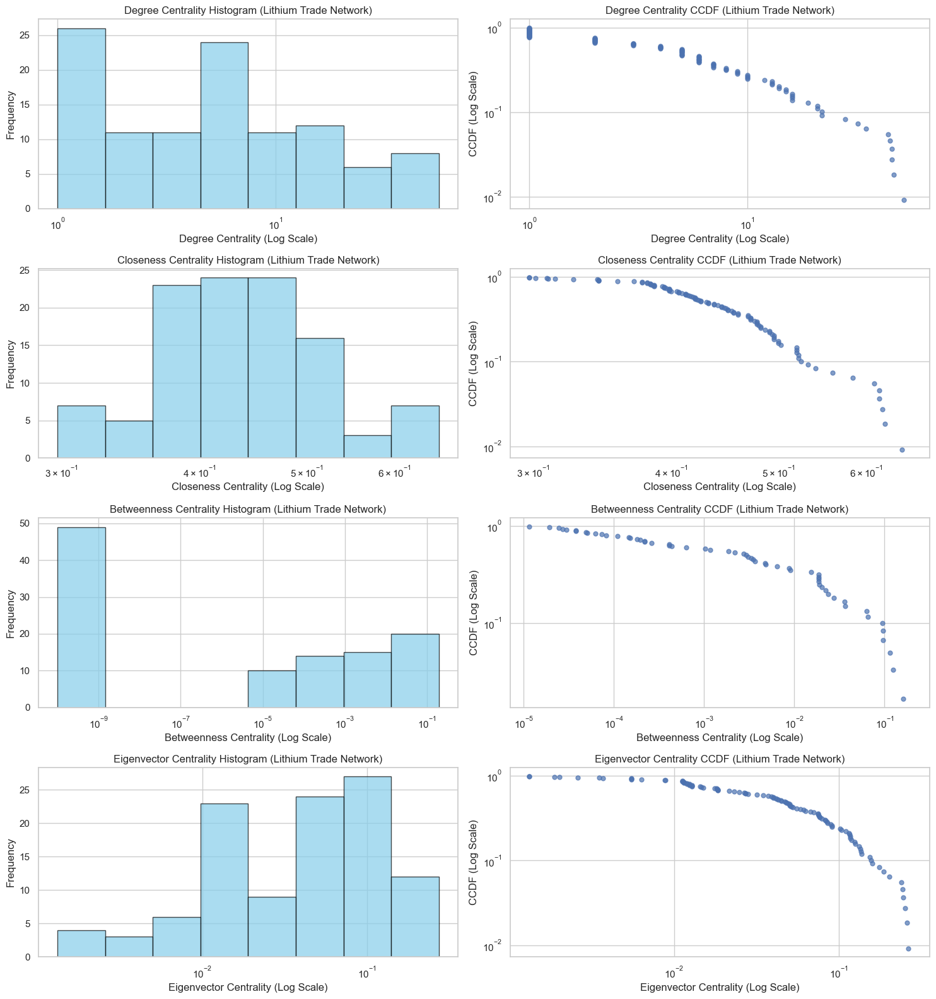

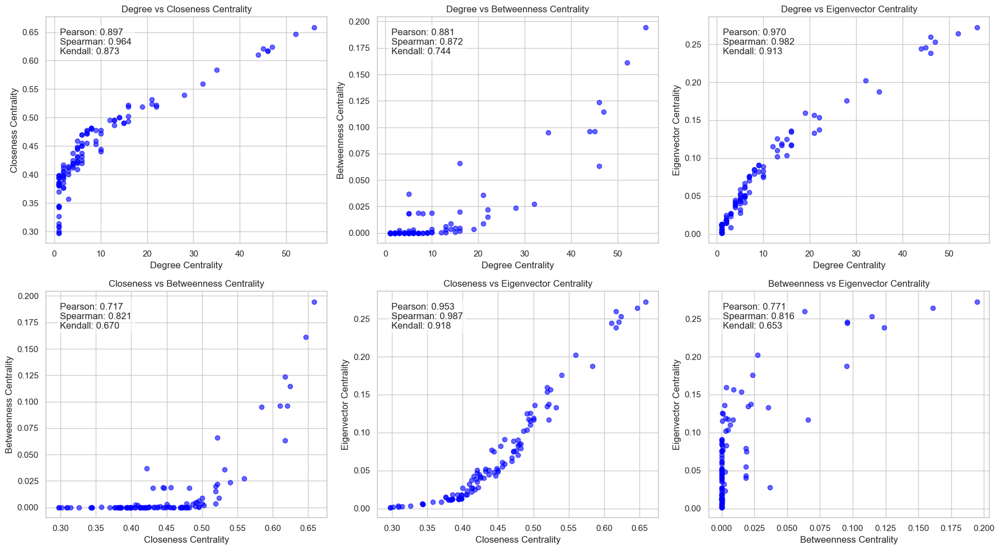

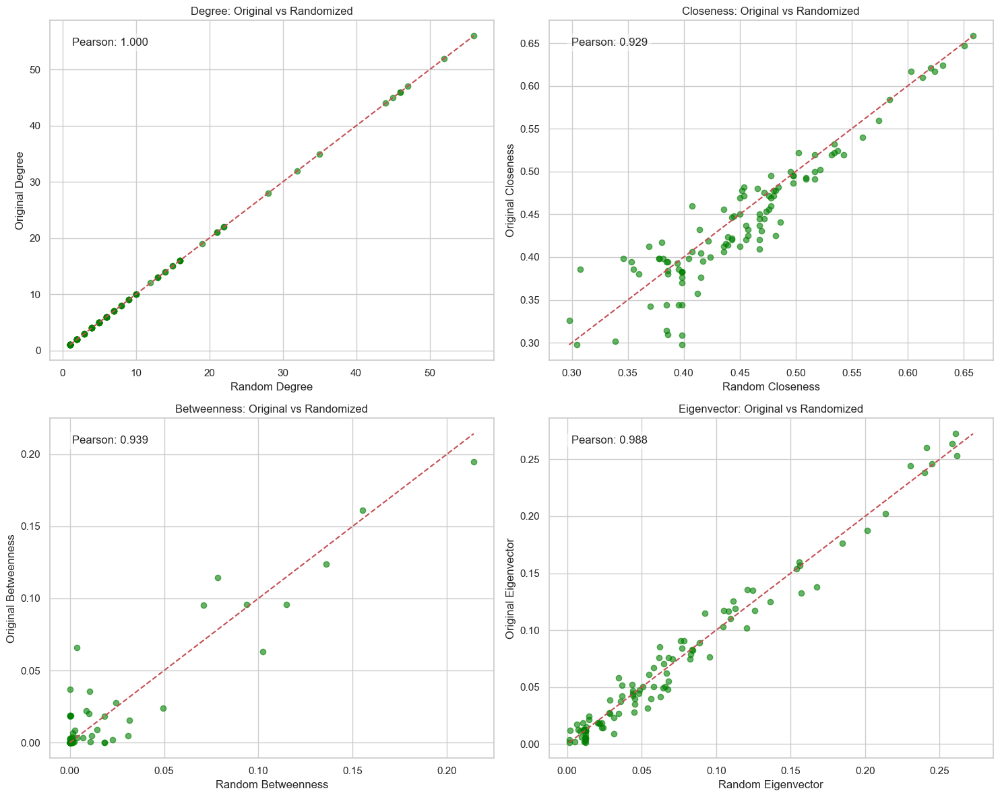

In [81]:
compare_centralities(yearly_graphs[2020])

In [82]:
country_name_mapping = {
    "USA": "United States of America",
    "Türkiye": "Turkey",
    'China, Hong Kong SAR': 'China',
    'Other Asia, nes': 'China',
    'Dem. Rep. of the Congo': 'Democratic Republic of the Congo',
    'Serbia':"Republic of Serbia",
    'Malta':"Italy",
    'Russian Federation':"Russia",
    'Eswatini':"eSwatini",
    'Rep. of Korea':"South Korea",
    'Czech Republic':'Czechia',
    'United States':"United States of America",
    'Bolivia (Plurinational State of)':"Bolivia",
    'Rep. of Moldova':"Moldova",
    'United Rep. of Tanzania': "United Republic of Tanzania",
    "Viet Nam":"Vietnam"
}

def normalize_country_names(data, column_name):
    return data[column_name].replace(country_name_mapping)

In [83]:
def preprocess(year):
    shapefile_path = os.path.join("dataset", "110m_cultural", "ne_110m_admin_0_countries.shp")
    world = gpd.read_file(shapefile_path)

    export_data = df[df['t'] == year].groupby('export_country')['v'].sum().reset_index()
    import_data = df[df['t'] == year].groupby('import_country')['v'].sum().reset_index()

    export_data['export_country'] = normalize_country_names(export_data, 'export_country')
    import_data['import_country'] = normalize_country_names(import_data, 'import_country')

    export_data = export_data.groupby('export_country')['v'].sum().reset_index()
    import_data = import_data.groupby('import_country')['v'].sum().reset_index()

    unmatched_exports = set(export_data['export_country']) - set(world['ADMIN'])
    unmatched_imports = set(import_data['import_country']) - set(world['ADMIN'])

    if unmatched_exports or unmatched_imports:
        print(
            f"Unmatched countries found:\n"
            f"Exports - {unmatched_exports}\n"
            f"Imports - {unmatched_imports}\n"
        )

    world_export = world.merge(export_data, left_on="ADMIN", right_on="export_country", how="left")
    world_import = world.merge(import_data, left_on="ADMIN", right_on="import_country", how="left")

    return world_export, world_import

In [84]:
gray_blue_cmap = mcolors.LinearSegmentedColormap.from_list(
    "gray_blue",
    ["gray", "blue"]
)

gray_red_cmap = mcolors.LinearSegmentedColormap.from_list(
    "gray_red",
    ["gray", "red"]
)

Unmatched countries found:
Exports - {'Singapore'}
Imports - {'Singapore'}



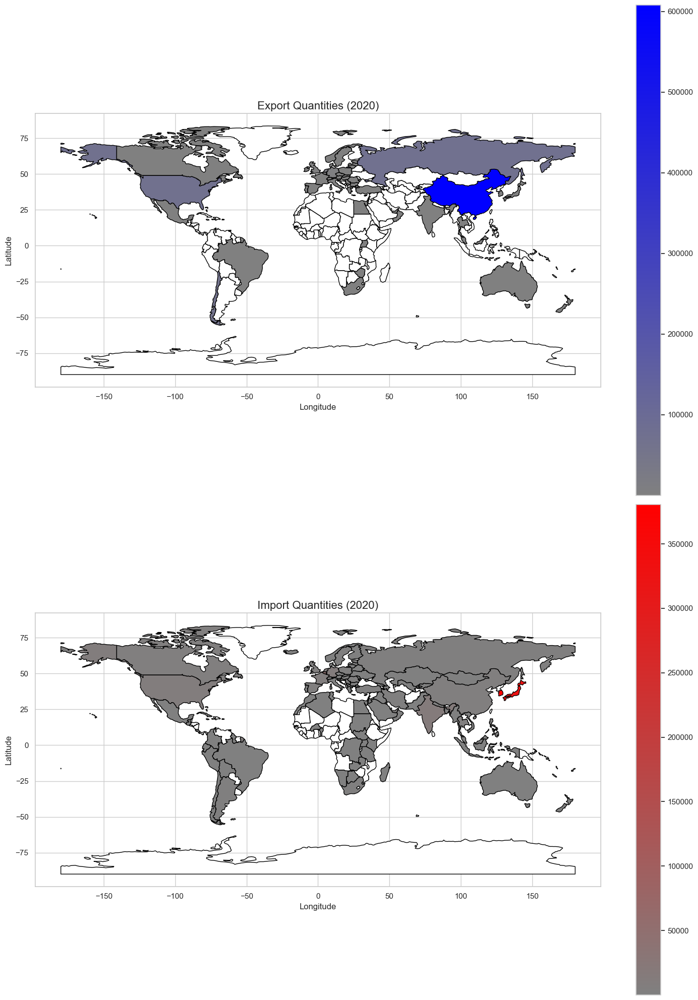

In [85]:
def plot_map(year):
    world_export, world_import = preprocess(year)
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 20))
    fig.patch.set_facecolor('white')
    for a in ax:
        a.set_facecolor('white')
    world_export.plot(
        column="v",
        cmap=gray_blue_cmap,
        legend=True,
        ax=ax[0],
        missing_kwds={"color": "white"},
        edgecolor="black"
    )
    ax[0].set_title(f"Export Quantities ({year})", fontsize=16)
    ax[0].set_xlabel("Longitude", fontsize=12)
    ax[0].set_ylabel("Latitude", fontsize=12)

    world_import.plot(
        column="v",
        cmap=gray_red_cmap,
        legend=True,
        ax=ax[1],
        missing_kwds={"color": "white"},
        edgecolor="black"
    )
    ax[1].set_title(f"Import Quantities ({year})", fontsize=16)
    ax[1].set_xlabel("Longitude", fontsize=12)
    ax[1].set_ylabel("Latitude", fontsize=12)

    plt.tight_layout()
    plt.savefig(os.path.join("graphics", "net_export_map_vertical.png"), dpi=300, facecolor='white')
    plt.show()

plot_map(2020)


Unmatched countries found:
Exports - {'Singapore'}
Imports - {'Singapore'}



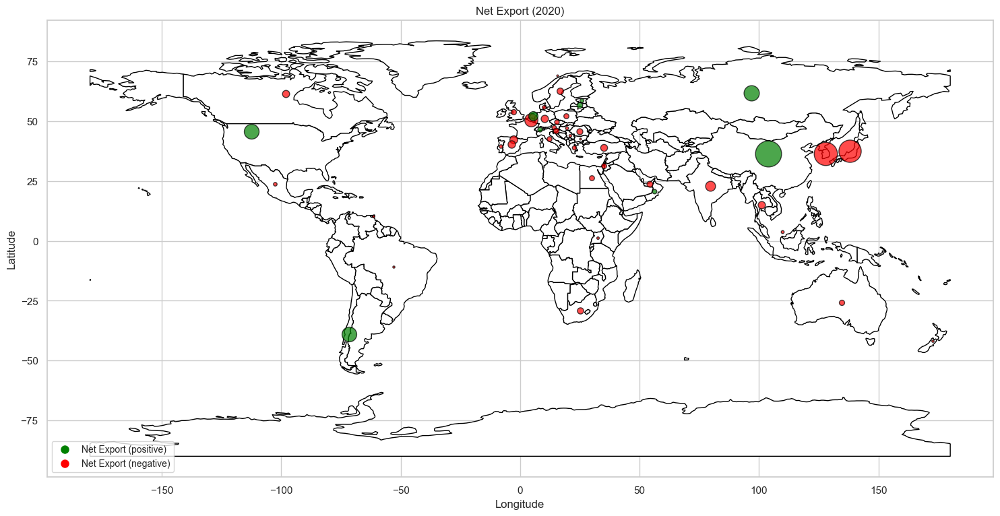

In [86]:
def plot_map_2(year: int):
    shapefile_path = os.path.join("dataset", "110m_cultural", "ne_110m_admin_0_countries.shp")
    world = gpd.read_file(shapefile_path)
    world_export, world_import = preprocess(year)

    net_export = (
        world_export.set_index("export_country")["v"]
        - world_import.set_index("import_country")["v"]
    ).reset_index()
    net_export.columns = ["country", "net_export"]

    world_net = world.merge(net_export, left_on="ADMIN", right_on="country", how="left")

    fig, ax = plt.subplots(1, 1, figsize=(15, 10))

    world.plot(ax=ax, color="white", edgecolor="black")
    ax.set_facecolor('none')

    for _, row in world_net.iterrows():
        if pd.notnull(row["net_export"]) and row["net_export"] != 0:
            size = np.sqrt(abs(row["net_export"]))
            color = "green" if row["net_export"] > 0 else "red"
            ax.scatter(
                row.geometry.centroid.x,
                row.geometry.centroid.y,
                s=size,
                color=color,
                alpha=0.7,
                edgecolor="black"
            )

    handles = [
        plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="green", markersize=10, label="Net Export (positive)"),
        plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="red", markersize=10, label="Net Export (negative)"),
    ]
    ax.legend(handles=handles, loc="lower left", fontsize="small")

    ax.set_title(f"Net Export ({year})")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.savefig(os.path.join("graphics", "net_export_map_2.png"), dpi=300, transparent=True)
    plt.show()

plot_map_2(2020)


Unmatched countries found:
Exports - {'Singapore'}
Imports - {'Singapore'}



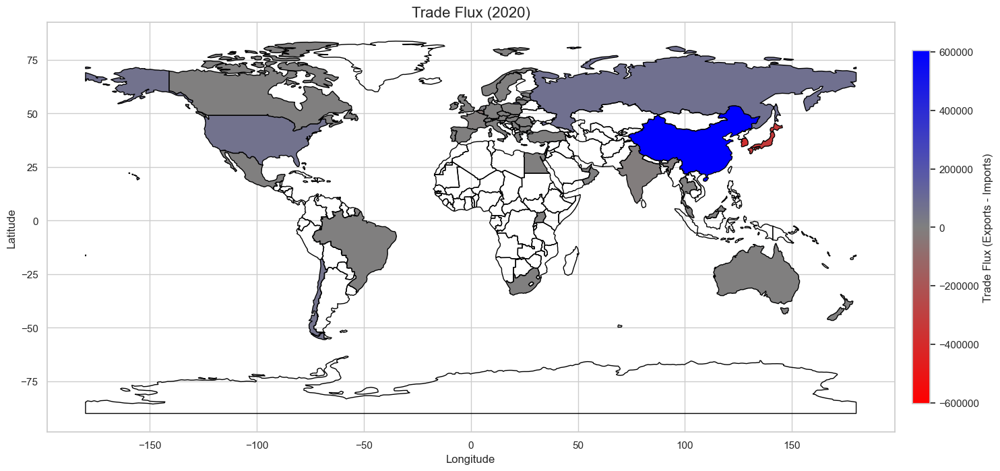

In [87]:
def plot_flux(year):
    world_export, world_import = preprocess(year)

    world_flux = world_export[["ADMIN", "geometry", "v"]].merge(
        world_import[["ADMIN", "v"]], on="ADMIN", suffixes=("_exp", "_imp")
    )
    world_flux["flux"] = world_flux["v_exp"] - world_flux["v_imp"]

    vmax = world_flux["flux"].abs().max()

    flux_cmap = mcolors.LinearSegmentedColormap.from_list("flux_cmap", ["red", "gray", "blue"])
    norm = mcolors.Normalize(vmin=-vmax, vmax=vmax)

    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    fig.patch.set_alpha(0)
    ax.set_facecolor((0, 0, 0, 0))

    world_flux.plot(
        column="flux",
        cmap=flux_cmap,
        norm=norm,
        legend=False,
        ax=ax,
        missing_kwds={"color": "none"},
        edgecolor="black"
    )

    sm = plt.cm.ScalarMappable(norm=norm, cmap=flux_cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, orientation="vertical", fraction=0.02, pad=0.02)
    cbar.set_label("Trade Flux (Exports - Imports)")

    ax.set_title(f"Trade Flux ({year})", fontsize=16)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)

    plt.tight_layout()
    plt.savefig(
        os.path.join("graphics", "trade_flux_map.png"),
        dpi=300,
        transparent=True  # Save with a transparent background
    )
    plt.show()

plot_flux(2020)


In [89]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Function to plot degree distributions of multiple graphs
def plot_degree_distributions(graph_list, labels):
    fig, ax = plt.subplots(figsize=(14, 8))
    markers = ['o', 's', '^', 'D', 'v', 'P', '*', 'X', 'h', '+']
    colors = plt.cm.tab10.colors

    for i, g in enumerate(graph_list):
        degrees = np.array([degree for _, degree in g.degree()])
        degrees = degrees[degrees > 0]  # Filter out nodes with degree 0

        unique, counts = np.unique(degrees, return_counts=True)
        probs = counts / np.sum(counts)

        sorted_indices = np.argsort(unique)
        unique = unique[sorted_indices]
        probs = probs[sorted_indices]

        ax.plot(unique, probs, linestyle='-', marker=markers[i % len(markers)],
                markersize=6, markeredgewidth=0.5, markeredgecolor='black',
                color=colors[i % len(colors)], label=labels[i])

    ax.loglog()
    ax.set_xlabel('$k$ (Degree)', fontsize=12)
    ax.set_ylabel('$P(k)$ (Probability)', fontsize=12)
    ax.set_title('Degree Distributions Comparison', fontweight='bold', fontsize=14)
    ax.legend()
    ax.grid(True, which="both", ls="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Function to plot a single graph with multiple fits
def plot_single_graph_with_fits(G, name):
    fig, ax = plt.subplots(figsize=(10, 6))

    degree_sequence = np.array([d for _, d in G.degree()])
    k_values, counts = np.unique(degree_sequence, return_counts=True)
    probs = counts / counts.sum()

    nonzero = probs > 0
    k_values = k_values[nonzero]
    probs = probs[nonzero]

    ax.loglog(k_values, probs, 'o', label="Empirical Data", color='blue', markersize=3)

    ##################
    # Power-law fit
    ##################
    gamma = 1 + len(degree_sequence) / np.sum(np.log(degree_sequence / degree_sequence.min()))
    x_powerlaw = k_values
    y_powerlaw = x_powerlaw ** (-gamma)
    y_powerlaw /= y_powerlaw.sum()  # Normalization
    ax.loglog(x_powerlaw, y_powerlaw, label=f"Power-law Fit (γ={gamma:.2f})", color='red', linewidth=2)

    ##################
    # Poisson fit
    ##################
    lambda_poisson = np.mean(degree_sequence)
    y_poisson = stats.poisson.pmf(k_values, lambda_poisson)
    y_poisson /= y_poisson.sum()  # Normalization
    ax.loglog(k_values, y_poisson, label="Poisson Fit", color='green', linestyle='--', linewidth=2)

    ##################
    # Exponential fit
    ##################
    y_exponential = (1 / lambda_poisson) * np.exp(-k_values / lambda_poisson)
    y_exponential /= y_exponential.sum()  # Normalization
    ax.loglog(k_values, y_exponential, label="Exponential Fit", color='orange', linestyle='-.', linewidth=2)

    ax.set_xlim([0.8 * k_values.min(), k_values.max() * 1.2])
    ax.set_ylim([0.5 * probs.min(), probs.max() * 2])

    ax.set_xlabel("Degree (k)")
    ax.set_ylabel("Probability p(k)")
    ax.set_title(f"Degree Distribution for {name}", fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, which="both", linestyle="--", linewidth=0.5)

    plt.tight_layout()
    plt.show()


In [90]:
##################################
# Graph tool Constructor
##################################
gtG = gt.Graph(directed=True)

eprop_exporter = gtG.new_edge_property("float")
eprop_importer = gtG.new_edge_property("float")
eprop_year = gtG.new_edge_property("float")
eprop_product_code = gtG.new_edge_property("float")
eprop_quantity = gtG.new_edge_property("float")


vertex_map = {}
vprop_country = gtG.new_vertex_property("string")
vprop_quantity_per_product = gtG.new_vertex_property("vector<int32_t>")

for idx, row in df.iterrows():
    exporter = row['export_country']
    importer = row['import_country']
    product_code = row['k']
    year = row['t']
    quantity = row['q']

    if exporter not in vertex_map:
        v_exporter = gtG.add_vertex()
        vertex_map[exporter] = v_exporter
        vprop_country[v_exporter] = exporter

    # Ensure importer is added as a vertex
    if importer not in vertex_map:
        v_importer = gtG.add_vertex()
        vertex_map[importer] = v_importer
        vprop_country[v_importer] = importer

    # Add an edge between exporter and importer
    e = gtG.add_edge(vertex_map[exporter], vertex_map[importer])

    # Assign edge properties
    eprop_year[e] = year
    eprop_product_code[e] = product_code
    eprop_quantity[e] = quantity

gtG.vertex_properties["country"] = vprop_country
gtG.edge_properties["year"] = eprop_year
gtG.edge_properties["product_code"] = eprop_product_code
gtG.edge_properties["quantity"] = eprop_quantity

NameError: name 'gt' is not defined

In [ ]:
#####################
# VISUALIZER
#####################
class TradeNetworkVisualizer:
    def __init__(self, product_graphs, dataframe):

        self.product_graphs = product_graphs
        self.gtG = gtG
        self.eprop_exporter = eprop_exporter
        self.eprop_importer = eprop_importer
        self.eprop_year = eprop_year
        self.eprop_product_code = eprop_product_code
        self.eprop_quantity = eprop_quantity
        self.vprop_country = vprop_country
        self.vprop_quantity_per_product = vprop_quantity_per_product
        self.dataframe = dataframe
        self.world = gpd.read_file('https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip')


    def visualize_product_graph(self, product_code, year):

        g_subgraph = gt.GraphView(
            gtG,
            efilt=lambda e: (eprop_year[e] == year) and (eprop_product_code[e] == product_code)
        )


        if g_subgraph is None:
            print(f"No trade data for product {product_code} in year {year}.")
            return


        state = gt.minimize_nested_blockmodel_dl(
            g_subgraph,
            state_args=dict(recs=[], rec_types=[]),
            multilevel_mcmc_args=dict(niter=1)
        )

        gt.draw_hierarchy(
            state,
            vertex_text = vprop_country,
            vsize_scale=5,
            vertex_text_position="centered",
            layout="radial",
            deg_size=True,
            rel_order="degree",
            output_size=(2000, 2000),
            beta=0.9,
        )

    def plot_trade_network(self, product_code, country_name, trade_type='export', figsize=(20, 15), export_to_png=False, export_file_name="", percentile=1.0):
        dataframe = self.dataframe

        if trade_type == 'export':
            filtered_data = dataframe[(dataframe.k == product_code) & (dataframe.export_country == country_name)]
        elif trade_type == 'import':
            filtered_data = dataframe[(dataframe.k == product_code) & (dataframe.import_country == country_name)]
        else:
            print("Invalid trade_type. Use 'export' or 'import'.")
            return

        if filtered_data.empty:
            print(f"No trade data found for product {product_code} and country {country_name}.")
            return

        total_volume = filtered_data['v'].sum()

        if total_volume == 0:
            print(f"No trade data found for product {product_code} and country {country_name}.")
            return

        filtered_data = filtered_data.sort_values(by='v', ascending=False)

        filtered_data['cumulative_v'] = filtered_data['v'].cumsum()
        filtered_data['cumulative_percentage'] = filtered_data['cumulative_v'] / total_volume

        if percentile < 1.0:
            filtered_data = filtered_data[filtered_data['cumulative_percentage'] <= percentile]
            if filtered_data.empty:
                print(f"No trade data found within the top {percentile*100}% for product {product_code} and country {country_name}.")
                return

        total_volume_filtered = filtered_data['v'].sum()

        if trade_type == 'export':
            volume_by_country = filtered_data.groupby('import_country')['v'].sum()
        elif trade_type == 'import':
            volume_by_country = filtered_data.groupby('export_country')['v'].sum()

        volume_by_country_share = (volume_by_country / total_volume_filtered).to_dict()

        G = nx.DiGraph()

        for _, row in filtered_data.iterrows():
            G.add_edge(row['export_country'], row['import_country'], weight=row['v'])

        node_sizes = {}
        node_colors = {}

        main_country_color = 'gold'
        main_country_size = 2000

        partner_node_sizes = []

        for node in G.nodes():
            if node == country_name:
                node_sizes[node] = main_country_size
                node_colors[node] = main_country_color
            else:
                share = volume_by_country_share.get(node, 0)
                size = 1000 * share + 300
                node_sizes[node] = size
                partner_node_sizes.append(size)
                node_colors[node] = None

        if partner_node_sizes:
            cmap = cm.get_cmap('coolwarm')
            norm = mcolors.Normalize(vmin=min(partner_node_sizes), vmax=max(partner_node_sizes))

            for node in G.nodes():
                if node != country_name:
                    node_colors[node] = cmap(norm(node_sizes[node]))
        else:
            for node in G.nodes():
                if node != country_name:
                    node_colors[node] = 'lightblue'

        edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
        if edge_weights:
            max_weight = max(edge_weights)
            edge_widths = [5 * (w / max_weight) for w in edge_weights]
        else:
            edge_widths = []

        plt.figure(figsize=figsize)
        pos = nx.spring_layout(G, k=0.5, iterations=50, seed=42)

        nx.draw_networkx_nodes(
            G, pos,
            node_size=[node_sizes[node] for node in G.nodes()],
            node_color=[node_colors[node] for node in G.nodes()],
            alpha=0.9
        )

        nx.draw_networkx_edges(
            G, pos, arrowstyle="->", arrowsize=15, edge_color="gray",
            width=edge_widths, alpha=0.7
        )

        nx.draw_networkx_labels(G, pos, font_size=12, font_weight="bold")

        def format_volume(volume):
            if volume >= 1e9:
                return f'{volume / 1e9:.2f}B'
            elif volume >= 1e6:
                return f'{volume / 1e6:.2f}M'
            elif volume >= 1e3:
                return f'{volume / 1e3:.2f}K'
            else:
                return f'{volume}'

        edge_labels = {
            (u, v): format_volume(G[u][v]['weight']) for u, v in G.edges()
        }
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10)

        product_title = filtered_data.description.unique()[0]

        title_trade = "Exporting from" if trade_type == 'export' else "Importing into"
        plt.title(
            f"Trade Network for {product_title} - {title_trade} {country_name}",
            fontsize=15,
            fontweight="bold"
        )

        if export_to_png:
            if not export_file_name:
                export_file_name = f"trade_network_{product_code}_{country_name}_{trade_type}.png"
            plt.savefig(export_file_name, bbox_inches='tight')
            plt.close()
        else:
            plt.axis('off')
            plt.show()


    def plot_trade_over_time(self, product_code, country_name, trade_type='export', figsize=(16, 8)):
        """
        Plots the trade volume over time for a specific product code and country.

        The plot includes:
        - The country's trade volume over time.
        - The total global trade volume for the product over time.
        - The country's relative share of the total trade volume over time.

        Args:
            product_code (str): The product code for which the trade volume is to be plotted.
            country_name (str): The name of the country to focus on (exporting or importing).
            trade_type (str, optional): 'export' to show exports from the country,
                                        'import' to show imports into the country. Defaults to 'export'.
            figsize (tuple, optional): Size of the plot. Defaults to (12, 6).

        Returns:
            None: Displays a line plot of the trade volume over time and the relative share over time.

        Notes:
            - Filters the dataset to include only rows for the specified product code and trade type.
            - Computes the country's trade volume over time.
            - Computes the total global trade volume for the product over time.
            - Calculates the country's relative share of the total trade volume over time.
            - Displays a plot with two y-axes:
                - Left y-axis: Trade volumes (country and total).
                - Right y-axis: Relative share (%).
            - Includes a legend to differentiate between the data series.
        """
        dataframe = self.dataframe

        product_data = dataframe[dataframe['k'] == product_code]

        if product_data.empty:
            print(f"No trade data found for product {product_code}.")
            return

        total_trade_volume_over_time = product_data.groupby('t')['v'].sum().reset_index()

        if trade_type == 'export':
            country_data = product_data[product_data['export_country'] == country_name]

        elif trade_type == 'import':
            country_data = product_data[product_data['import_country'] == country_name]

        else:
            print("Invalid trade_type. Use 'export' or 'import'.")
            return

        if country_data.empty:
            print(f"No trade data found for product {product_code} and country {country_name}.")
            return

        country_trade_volume_over_time = country_data.groupby('t')['v'].sum().reset_index()

        merged_data = pd.merge(
            country_trade_volume_over_time,
            total_trade_volume_over_time,
            on='t',
            how='right',
            suffixes=('_country', '_total')
        )

        merged_data['v_country'] = merged_data['v_country'].fillna(0)
        merged_data['relative_share'] = (merged_data['v_country'] / merged_data['v_total']) * 100
        merged_data.sort_values('t', inplace=True)

        fig, ax1 = plt.subplots(figsize=figsize)

        ax1.plot(
            merged_data['t'],
            merged_data['v_country'],
            marker='o',
            label=f"{country_name} Trade Volume",
            color='tab:blue'
        )

        ax1.plot(
            merged_data['t'],
            merged_data['v_total'],
            marker='s',
            label="Total Trade Volume",
            color='tab:green'
        )

        ax1.set_xticks(merged_data['t'])
        ax1.set_xticklabels(merged_data['t'].astype(int))

        ax1.set_xlabel('Year')
        ax1.set_ylabel('Trade Volume (log)')
        ax1.tick_params(axis='y')
        ax1.grid(True)
        ax1.set_yscale("log")

        ax2 = ax1.twinx()
        ax2.plot(
            merged_data['t'],
            merged_data['relative_share'],
            marker='^',
            label=f"{country_name} Relative Share (%)",
            color='tab:red'
        )
        ax2.set_ylabel('Relative Share (%)')
        ax2.tick_params(axis='y', labelcolor='tab:red')

        lines_1, labels_1 = ax1.get_legend_handles_labels()
        lines_2, labels_2 = ax2.get_legend_handles_labels()
        ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

        product_title = dataframe[dataframe.k == product_code].description.unique()[0]

        plt.title(f"{product_title}\n{trade_type.title()} by {country_name}", fontweight="bold")
        plt.show()


    def plot_trade_treemap(self, product_code, year, trade_type='export', top_n=None, show_volumes=True, color_scale='Viridis'):
        dataframe = self.dataframe

        if trade_type == 'export':
            df_filtered = dataframe[(dataframe['k'] == product_code) & (dataframe['t'] == year)]
            df_grouped = df_filtered.groupby(['export_country', 'import_country'])['v'].sum().reset_index()
            path = ['export_country', 'import_country']

        elif trade_type == 'import':
            df_filtered = dataframe[(dataframe['k'] == product_code) & (dataframe['t'] == year)]
            df_grouped = df_filtered.groupby(['import_country', 'export_country'])['v'].sum().reset_index()
            path = ['import_country', 'export_country']

        else:
            return

        if df_grouped.empty:
            return

        if top_n is not None:
            df_grouped = df_grouped.nlargest(top_n, 'v')

        product_title = df_filtered['description'].unique()[0]

        fig = px.treemap(
            df_grouped,
            path=path,
            values='v',
            color='v',
            color_continuous_scale=color_scale,
            title=f'Trade Volume Treemap for "{product_title}" in {year} ({trade_type.title()})',
            labels={'v': 'Trade Volume'},
            hover_data={'v': ':,.2f'},
        )

        fig.update_layout(
            template='plotly_dark',
            margin=dict(t=50, l=25, r=25, b=25),
            height=800
        )

        if show_volumes:
            fig.data[0].textinfo = 'label+value+percent root'
            fig.data[0].texttemplate = '<b>%{label}</b><br>Trade Volume: %{value:,.2f}<br>%{percentRoot:.2%} of Total Volume'

        else:
            fig.data[0].textinfo = 'label+percent root'
            fig.data[0].texttemplate = '<b>%{label}</b><br>%{percentRoot:.2%} of Total Volume'

        fig.update_coloraxes(colorbar_title='Trade Volume')
        fig.update_traces(marker=dict(cornerradius=5))

        fig.show()


    def visualize_trade_changes(self, year1: int, year2: int, trade_type: str, origin_country: str, hso_code: int):
        df = self.dataframe.copy(deep=True)
        df = df[df.k == hso_code]

        if trade_type == "exports":
            df_filtered = df[df['export_country'] == origin_country]
            group_by_country = 'import_country'
        elif trade_type == "imports":
            df_filtered = df[df['import_country'] == origin_country]
            group_by_country = 'export_country'
        else:
            raise ValueError("Invalid trade_type. Choose 'imports' or 'exports'.")

        df_year1 = df_filtered[df_filtered['t'] == year1].groupby(group_by_country)['q'].sum().reset_index()
        df_year2 = df_filtered[df_filtered['t'] == year2].groupby(group_by_country)['q'].sum().reset_index()

        df_year1.rename(columns={'q': f'quantity_{year1}'}, inplace=True)
        df_year2.rename(columns={'q': f'quantity_{year2}'}, inplace=True)

        df_change = pd.merge(df_year1, df_year2, on=group_by_country, how='outer').fillna(0)

        df_change['relative_change'] = (df_change[f'quantity_{year2}'] - df_change[f'quantity_{year1}']) / \
                                       df_change[f'quantity_{year1}'].replace(0, np.nan)
        df_change.replace([np.inf, -np.inf], np.nan, inplace=True)

        df_change[group_by_country] = df_change[group_by_country].replace({
            'USA': 'United States',
            'Republic of Korea': 'South Korea',
            'Czechia': 'Czech Republic',
            'Türkiye': 'Turkey',
            'Viet Nam': 'Vietnam',
            'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom',
            'Iran (Islamic Republic of)': 'Iran',
            'Lao People\'s Democratic Republic': 'Laos',
            'Venezuela (Bolivarian Republic of)': 'Venezuela',
            'Democratic Republic of the Congo': 'Democratic Republic of the Congo',
        })

        world_merged = self.world.merge(df_change, how='left', left_on='NAME', right_on=group_by_country)

        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)

        world_merged.plot(
            column='relative_change',
            cmap='coolwarm',
            linewidth=0.8,
            ax=ax,
            edgecolor='0.8',
            legend=True,
            cax=cax,
            vmin=-1,
            vmax=1,
            missing_kwds={'color': 'lightgrey'}
        )
        ax.set_title(f"Relative Change for {hso_code} in {trade_type.capitalize()} from {year1} to {year2} ({origin_country})", fontweight="bold")
        ax.axis('off')

        plt.show()